# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

tf.enable_eager_execution()
# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

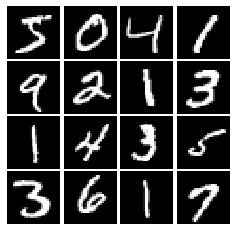

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x, alpha * x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random_uniform([batch_size, dim], -1, 1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [12]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1),
        
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [13]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [16]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.Dense(784, activation='tanh'),
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [17]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [23]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    loss_real = loss_obj(tf.ones(logits_real.get_shape()), logits_real)
    loss_fake = loss_obj(tf.zeros(logits_fake.get_shape()), logits_fake)
    
    loss = loss_real + loss_fake

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    loss = loss_obj(tf.ones(logits_fake.get_shape()), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [24]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

W1222 14:18:09.249454 4745844160 deprecation.py:323] From /Users/liweiwang/Desktop/ML/venv3/lib/python3.6/site-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Maximum error in d_loss: 3.97058e-09


In [25]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [29]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    D_solver = tf.keras.optimizers.Adam(learning_rate, beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate, beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [30]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.307, G:0.7131


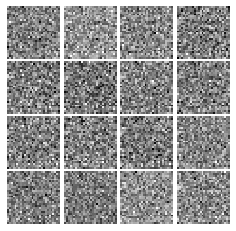

Epoch: 0, Iter: 20, D: 0.5581, G:1.04


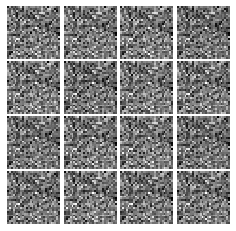

Epoch: 0, Iter: 40, D: 0.431, G:1.124


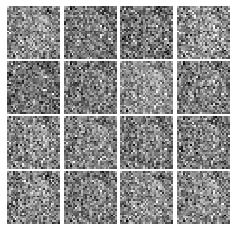

Epoch: 0, Iter: 60, D: 2.434, G:0.2921


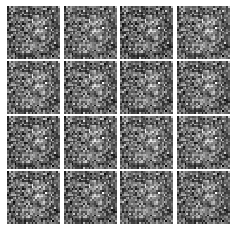

Epoch: 0, Iter: 80, D: 0.6531, G:1.95


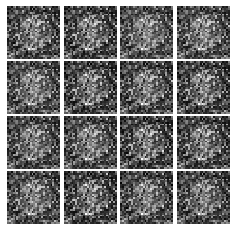

Epoch: 0, Iter: 100, D: 2.125, G:0.2619


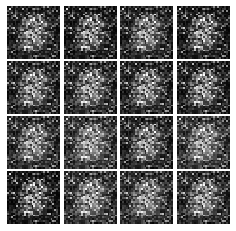

Epoch: 0, Iter: 120, D: 1.185, G:1.576


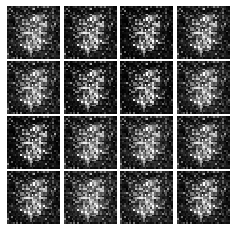

Epoch: 0, Iter: 140, D: 1.566, G:0.857


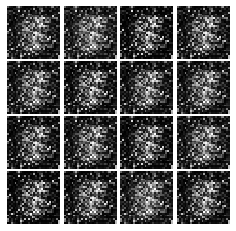

Epoch: 0, Iter: 160, D: 1.724, G:1.111


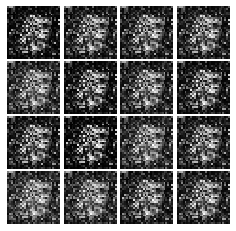

Epoch: 0, Iter: 180, D: 1.267, G:1.143


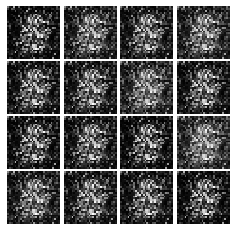

Epoch: 0, Iter: 200, D: 1.165, G:1.236


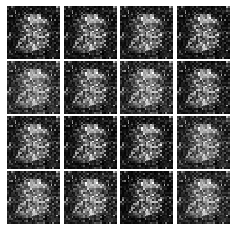

Epoch: 0, Iter: 220, D: 1.158, G:1.41


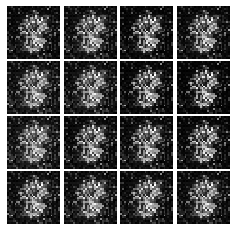

Epoch: 0, Iter: 240, D: 1.504, G:0.8111


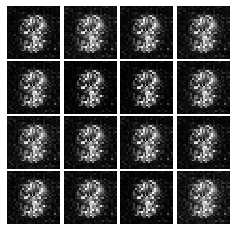

Epoch: 0, Iter: 260, D: 0.7063, G:1.668


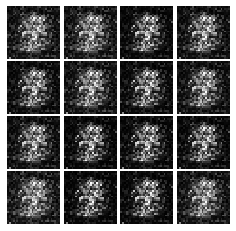

Epoch: 0, Iter: 280, D: 0.9003, G:1.821


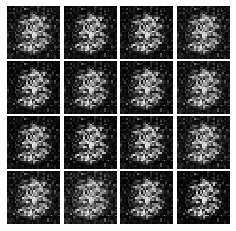

Epoch: 0, Iter: 300, D: 1.259, G:1.42


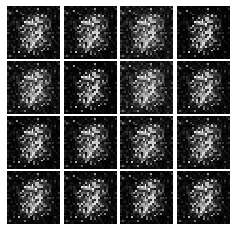

Epoch: 0, Iter: 320, D: 0.7841, G:1.522


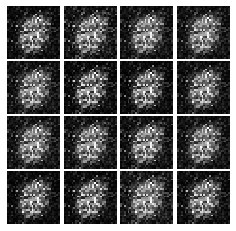

Epoch: 0, Iter: 340, D: 0.9818, G:1.313


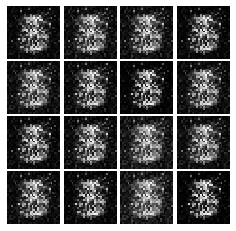

Epoch: 0, Iter: 360, D: 0.8185, G:1.6


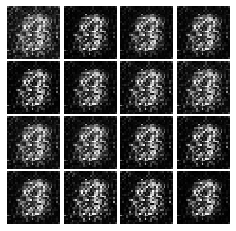

Epoch: 0, Iter: 380, D: 0.9075, G:1.548


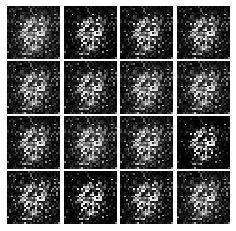

Epoch: 0, Iter: 400, D: 1.945, G:1.567


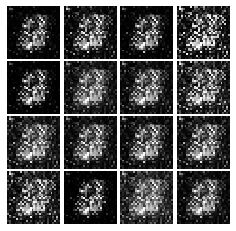

Epoch: 0, Iter: 420, D: 1.315, G:1.31


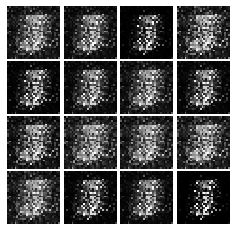

Epoch: 0, Iter: 440, D: 1.168, G:1.071


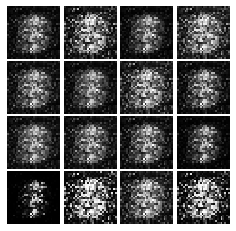

Epoch: 0, Iter: 460, D: 1.149, G:3.488


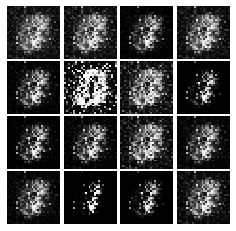

Epoch: 1, Iter: 480, D: 0.9975, G:1.258


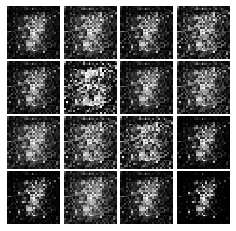

Epoch: 1, Iter: 500, D: 0.972, G:1.39


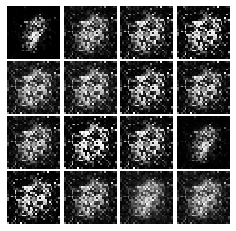

Epoch: 1, Iter: 520, D: 1.477, G:0.2373


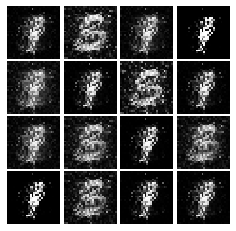

Epoch: 1, Iter: 540, D: 0.9418, G:1.472


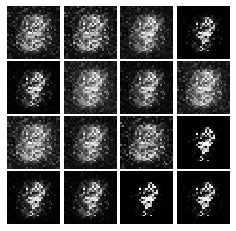

Epoch: 1, Iter: 560, D: 1.131, G:1.59


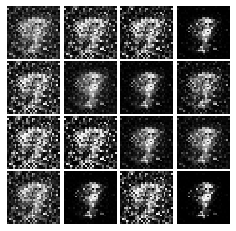

Epoch: 1, Iter: 580, D: 0.9658, G:1.133


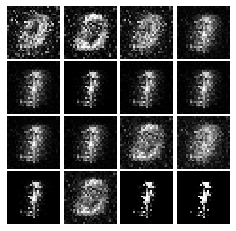

Epoch: 1, Iter: 600, D: 1.102, G:1.483


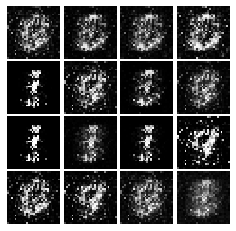

Epoch: 1, Iter: 620, D: 1.1, G:1.433


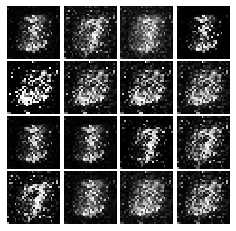

Epoch: 1, Iter: 640, D: 0.904, G:0.6733


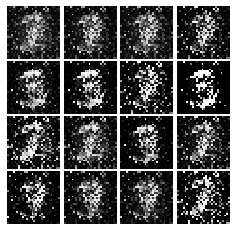

Epoch: 1, Iter: 660, D: 1.094, G:1.08


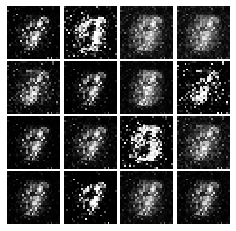

Epoch: 1, Iter: 680, D: 1.324, G:1.125


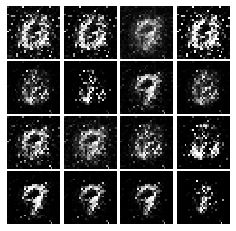

Epoch: 1, Iter: 700, D: 1.157, G:1.837


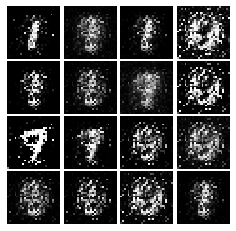

Epoch: 1, Iter: 720, D: 1.107, G:1.314


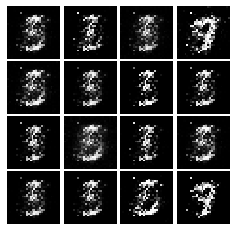

Epoch: 1, Iter: 740, D: 1.192, G:2.715


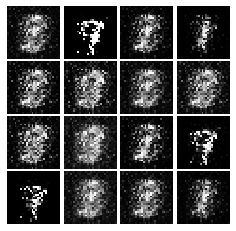

Epoch: 1, Iter: 760, D: 1.037, G:1.227


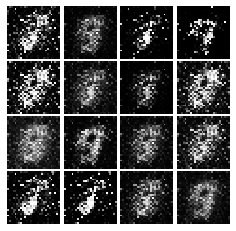

Epoch: 1, Iter: 780, D: 1.768, G:0.9711


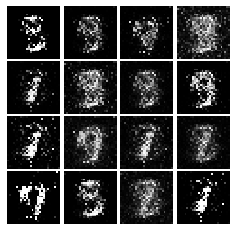

Epoch: 1, Iter: 800, D: 1.171, G:1.039


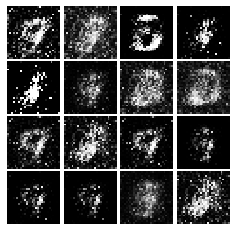

Epoch: 1, Iter: 820, D: 1.501, G:1.579


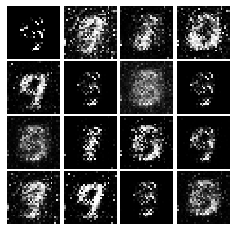

Epoch: 1, Iter: 840, D: 1.17, G:0.8797


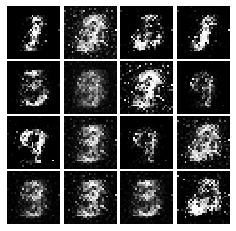

Epoch: 1, Iter: 860, D: 1.212, G:0.8562


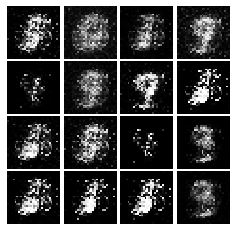

Epoch: 1, Iter: 880, D: 1.283, G:1.138


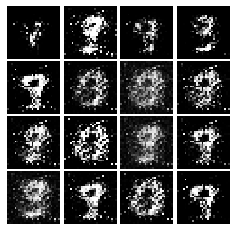

Epoch: 1, Iter: 900, D: 1.294, G:0.8364


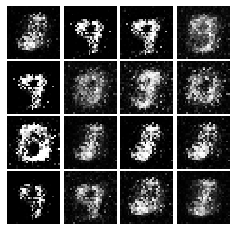

Epoch: 1, Iter: 920, D: 1.335, G:0.8963


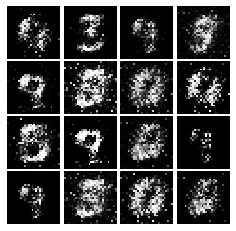

Epoch: 2, Iter: 940, D: 1.255, G:1.155


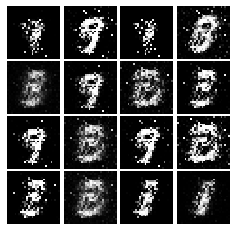

Epoch: 2, Iter: 960, D: 1.121, G:1.027


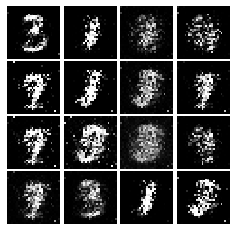

Epoch: 2, Iter: 980, D: 1.165, G:1.39


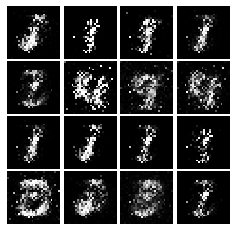

Epoch: 2, Iter: 1000, D: 3.649, G:0.3233


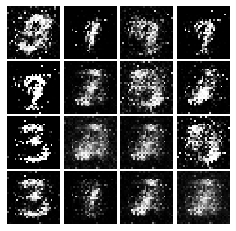

Epoch: 2, Iter: 1020, D: 1.601, G:1.165


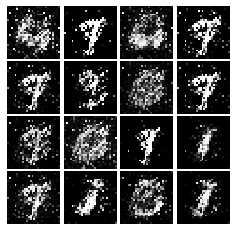

Epoch: 2, Iter: 1040, D: 1.315, G:1.882


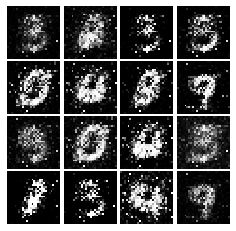

Epoch: 2, Iter: 1060, D: 1.185, G:1.158


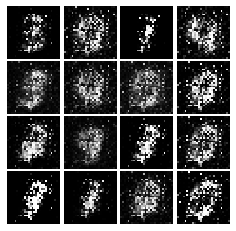

Epoch: 2, Iter: 1080, D: 1.204, G:1.129


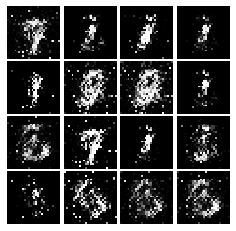

Epoch: 2, Iter: 1100, D: 1.167, G:1.286


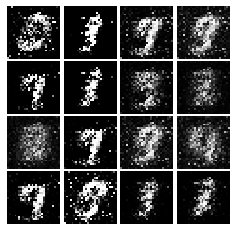

Epoch: 2, Iter: 1120, D: 1.182, G:1.933


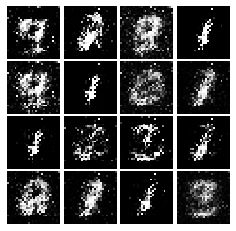

Epoch: 2, Iter: 1140, D: 1.129, G:1.511


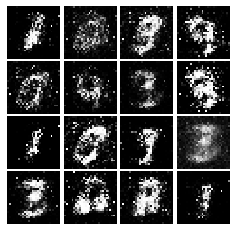

Epoch: 2, Iter: 1160, D: 1.256, G:0.883


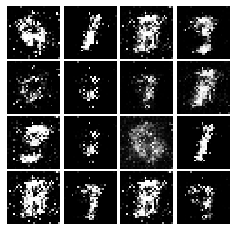

Epoch: 2, Iter: 1180, D: 1.197, G:1.119


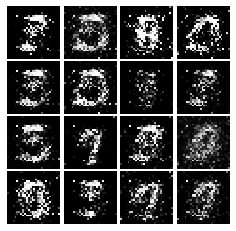

Epoch: 2, Iter: 1200, D: 1.302, G:0.9236


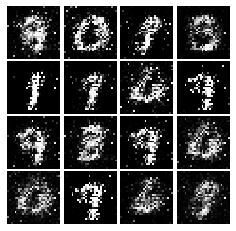

Epoch: 2, Iter: 1220, D: 1.246, G:1.001


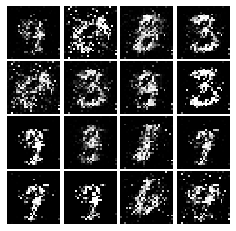

Epoch: 2, Iter: 1240, D: 1.178, G:1.08


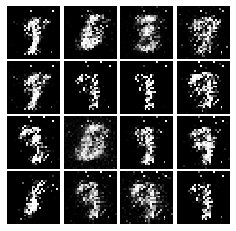

Epoch: 2, Iter: 1260, D: 1.096, G:1.247


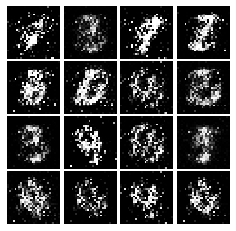

Epoch: 2, Iter: 1280, D: 1.296, G:1.097


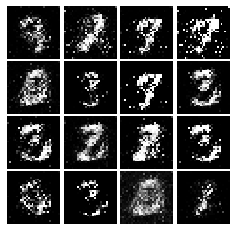

Epoch: 2, Iter: 1300, D: 1.434, G:3.181


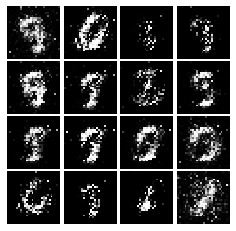

Epoch: 2, Iter: 1320, D: 1.201, G:1.061


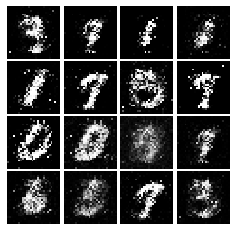

Epoch: 2, Iter: 1340, D: 1.188, G:0.8789


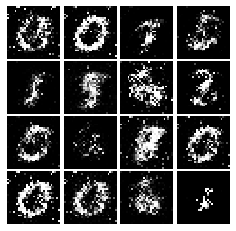

Epoch: 2, Iter: 1360, D: 1.175, G:0.91


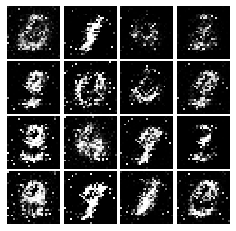

Epoch: 2, Iter: 1380, D: 1.254, G:0.855


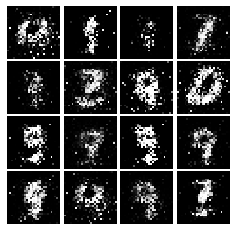

Epoch: 2, Iter: 1400, D: 1.225, G:0.9121


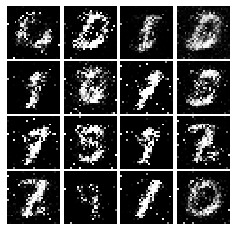

Epoch: 3, Iter: 1420, D: 1.172, G:1.337


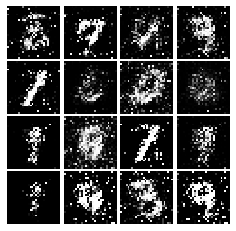

Epoch: 3, Iter: 1440, D: 1.133, G:1.087


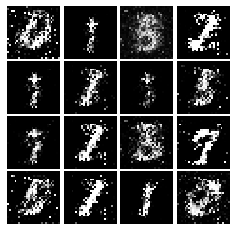

Epoch: 3, Iter: 1460, D: 1.331, G:1.054


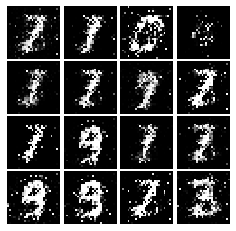

Epoch: 3, Iter: 1480, D: 1.198, G:0.9378


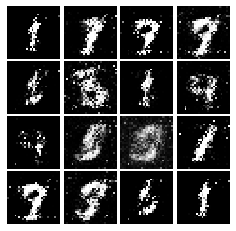

Epoch: 3, Iter: 1500, D: 1.335, G:0.8193


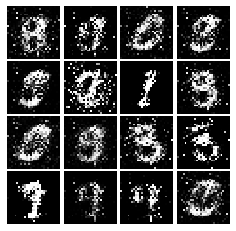

Epoch: 3, Iter: 1520, D: 1.375, G:0.7022


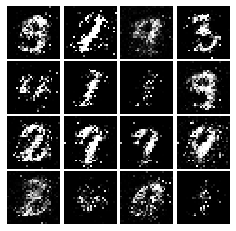

Epoch: 3, Iter: 1540, D: 1.328, G:0.9023


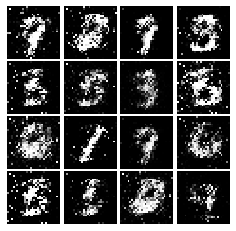

Epoch: 3, Iter: 1560, D: 1.22, G:0.9601


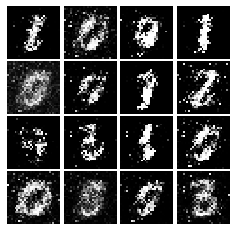

Epoch: 3, Iter: 1580, D: 1.121, G:1.042


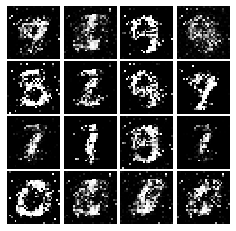

Epoch: 3, Iter: 1600, D: 1.24, G:0.8547


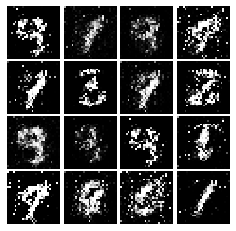

Epoch: 3, Iter: 1620, D: 1.334, G:0.779


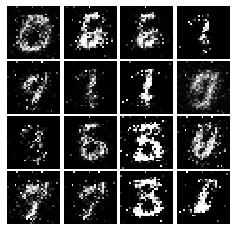

Epoch: 3, Iter: 1640, D: 1.294, G:0.8842


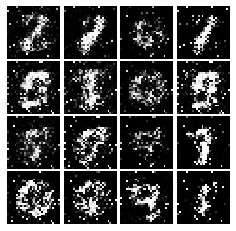

Epoch: 3, Iter: 1660, D: 1.041, G:0.9356


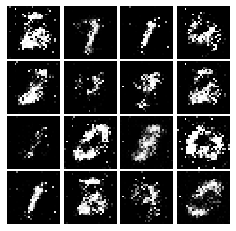

Epoch: 3, Iter: 1680, D: 1.259, G:0.82


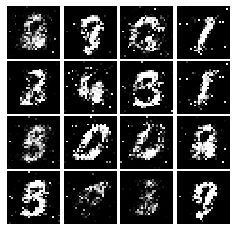

Epoch: 3, Iter: 1700, D: 1.515, G:0.8998


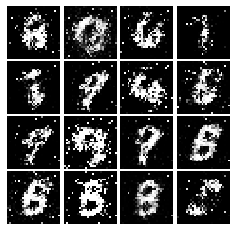

Epoch: 3, Iter: 1720, D: 1.26, G:0.8886


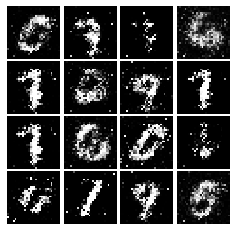

Epoch: 3, Iter: 1740, D: 1.228, G:0.9423


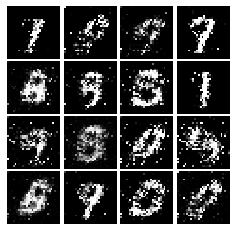

Epoch: 3, Iter: 1760, D: 1.15, G:1.01


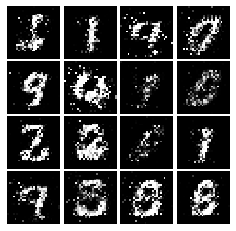

Epoch: 3, Iter: 1780, D: 1.263, G:0.8689


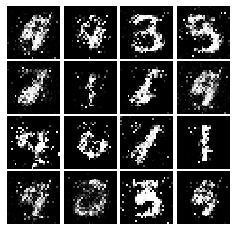

Epoch: 3, Iter: 1800, D: 1.274, G:0.8412


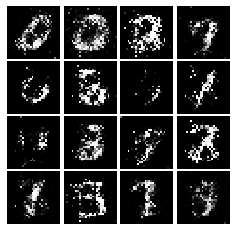

Epoch: 3, Iter: 1820, D: 1.321, G:0.9197


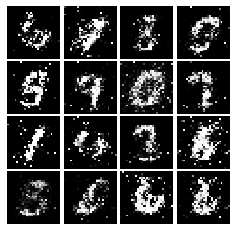

Epoch: 3, Iter: 1840, D: 1.353, G:0.933


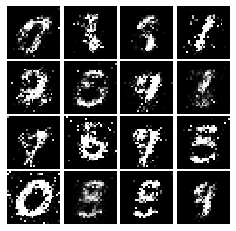

Epoch: 3, Iter: 1860, D: 1.228, G:1.009


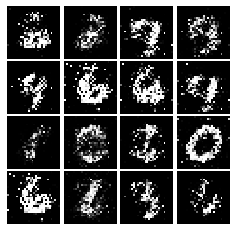

Epoch: 4, Iter: 1880, D: 1.483, G:0.7269


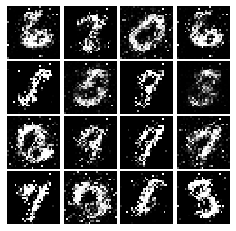

Epoch: 4, Iter: 1900, D: 1.191, G:1.297


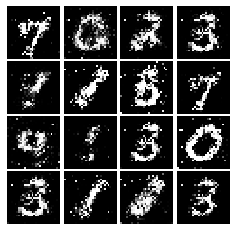

Epoch: 4, Iter: 1920, D: 1.375, G:0.3531


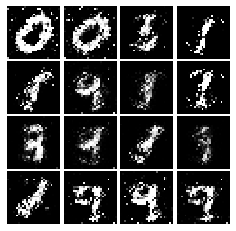

Epoch: 4, Iter: 1940, D: 1.242, G:0.8394


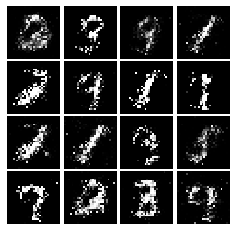

Epoch: 4, Iter: 1960, D: 1.253, G:0.7856


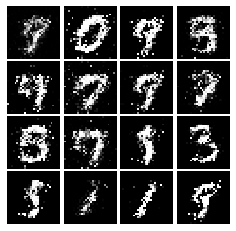

Epoch: 4, Iter: 1980, D: 1.358, G:0.8231


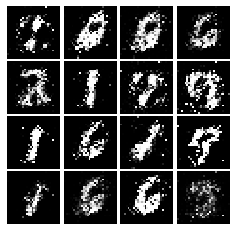

Epoch: 4, Iter: 2000, D: 1.34, G:1.007


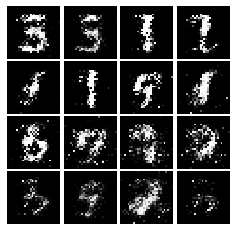

Epoch: 4, Iter: 2020, D: 1.312, G:0.8802


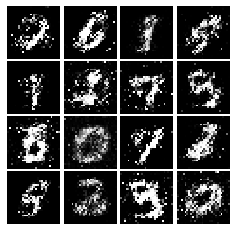

Epoch: 4, Iter: 2040, D: 1.248, G:0.936


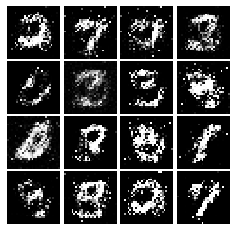

Epoch: 4, Iter: 2060, D: 1.361, G:0.8006


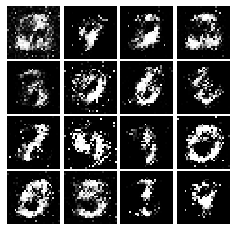

Epoch: 4, Iter: 2080, D: 1.295, G:0.882


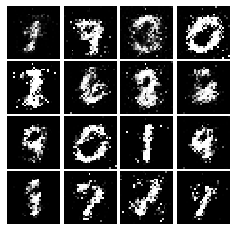

Epoch: 4, Iter: 2100, D: 1.266, G:0.8987


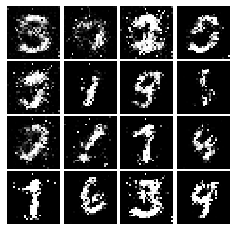

Epoch: 4, Iter: 2120, D: 1.317, G:0.7713


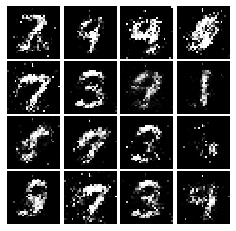

Epoch: 4, Iter: 2140, D: 1.357, G:0.7509


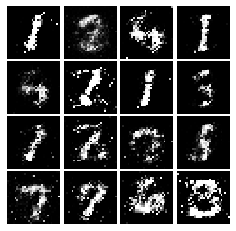

Epoch: 4, Iter: 2160, D: 1.339, G:0.7732


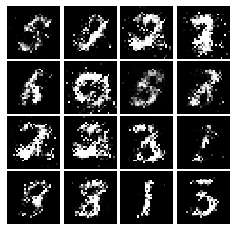

Epoch: 4, Iter: 2180, D: 1.35, G:0.8199


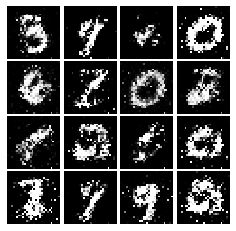

Epoch: 4, Iter: 2200, D: 1.275, G:0.9626


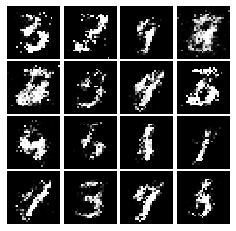

Epoch: 4, Iter: 2220, D: 1.353, G:0.7793


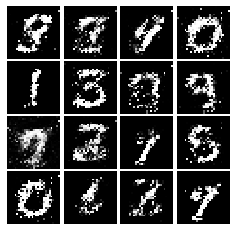

Epoch: 4, Iter: 2240, D: 1.318, G:0.8035


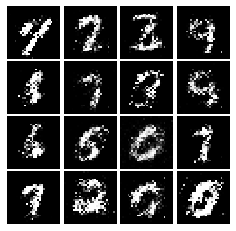

Epoch: 4, Iter: 2260, D: 1.294, G:0.8968


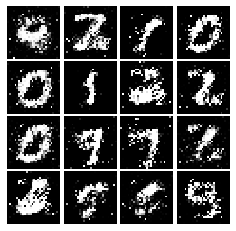

Epoch: 4, Iter: 2280, D: 1.454, G:0.8374


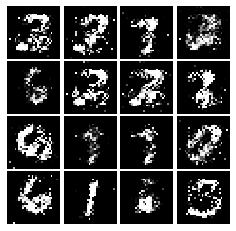

Epoch: 4, Iter: 2300, D: 1.258, G:0.7229


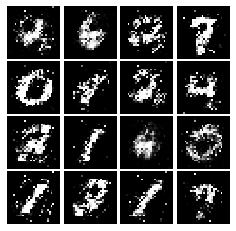

Epoch: 4, Iter: 2320, D: 1.312, G:0.8333


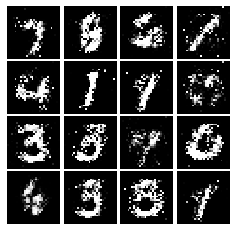

Epoch: 4, Iter: 2340, D: 1.163, G:0.8231


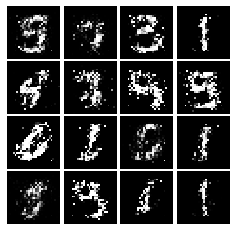

Epoch: 5, Iter: 2360, D: 1.285, G:0.8517


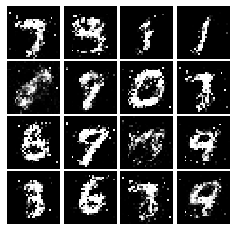

Epoch: 5, Iter: 2380, D: 1.334, G:0.884


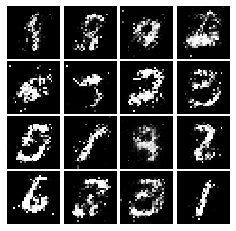

Epoch: 5, Iter: 2400, D: 1.234, G:0.8453


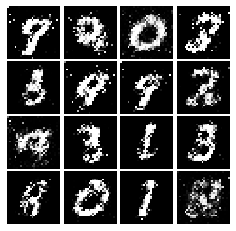

Epoch: 5, Iter: 2420, D: 1.282, G:0.799


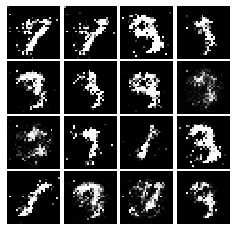

Epoch: 5, Iter: 2440, D: 1.201, G:0.5468


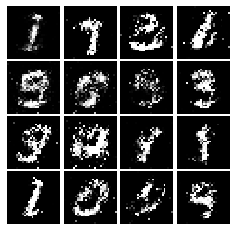

Epoch: 5, Iter: 2460, D: 1.305, G:0.8748


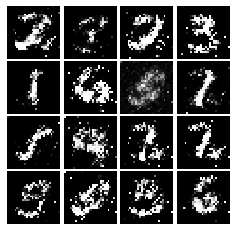

Epoch: 5, Iter: 2480, D: 1.323, G:0.7938


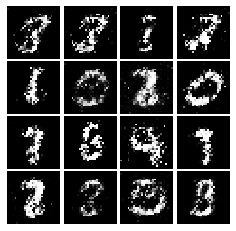

Epoch: 5, Iter: 2500, D: 1.184, G:0.9946


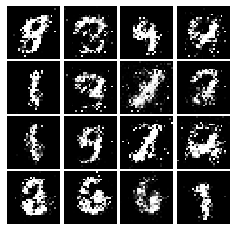

Epoch: 5, Iter: 2520, D: 1.521, G:1.027


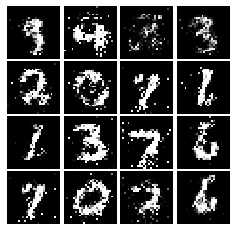

Epoch: 5, Iter: 2540, D: 1.369, G:0.7457


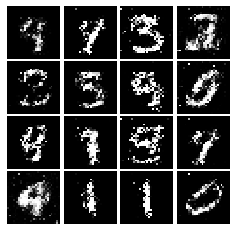

Epoch: 5, Iter: 2560, D: 1.497, G:0.6441


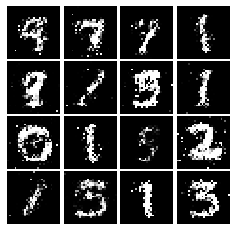

Epoch: 5, Iter: 2580, D: 1.226, G:1.243


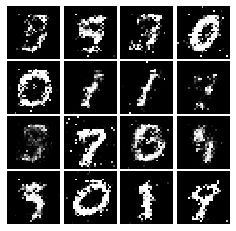

Epoch: 5, Iter: 2600, D: 1.376, G:0.6953


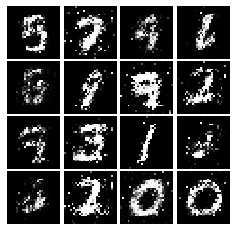

Epoch: 5, Iter: 2620, D: 1.292, G:0.7474


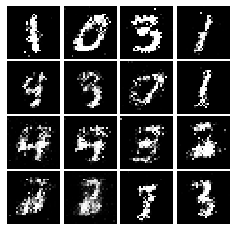

Epoch: 5, Iter: 2640, D: 1.383, G:0.9892


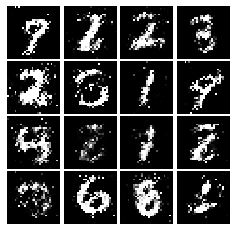

Epoch: 5, Iter: 2660, D: 1.275, G:0.8326


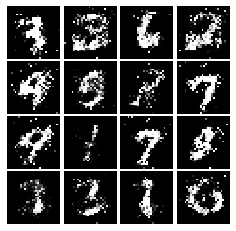

Epoch: 5, Iter: 2680, D: 1.435, G:0.8481


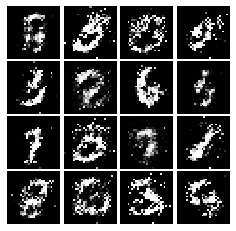

Epoch: 5, Iter: 2700, D: 1.406, G:0.8448


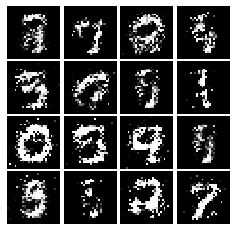

Epoch: 5, Iter: 2720, D: 1.26, G:0.885


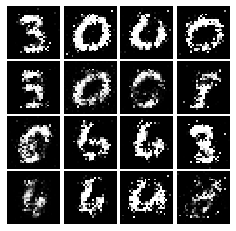

Epoch: 5, Iter: 2740, D: 1.291, G:0.7783


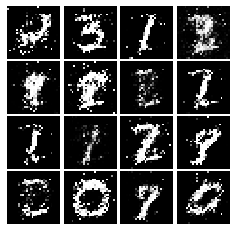

Epoch: 5, Iter: 2760, D: 1.456, G:0.6306


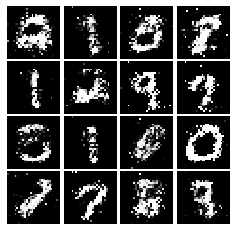

Epoch: 5, Iter: 2780, D: 1.256, G:0.7837


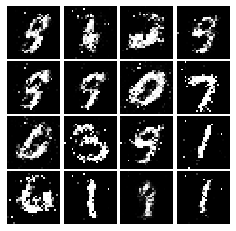

Epoch: 5, Iter: 2800, D: 1.302, G:0.8598


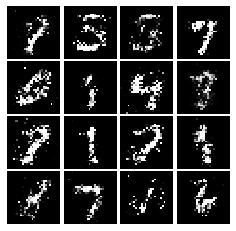

Epoch: 6, Iter: 2820, D: 1.368, G:0.8309


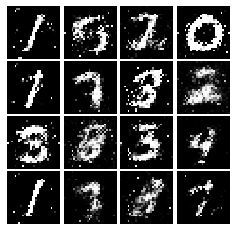

Epoch: 6, Iter: 2840, D: 1.366, G:0.7936


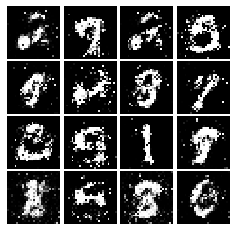

Epoch: 6, Iter: 2860, D: 1.41, G:1.043


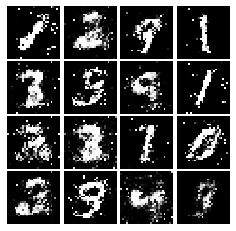

Epoch: 6, Iter: 2880, D: 1.346, G:0.7965


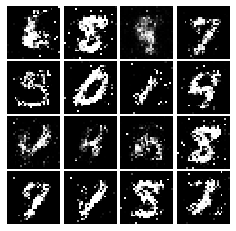

Epoch: 6, Iter: 2900, D: 1.379, G:0.9009


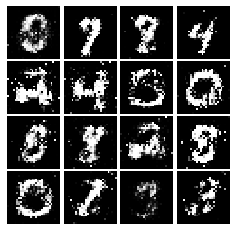

Epoch: 6, Iter: 2920, D: 1.378, G:0.9969


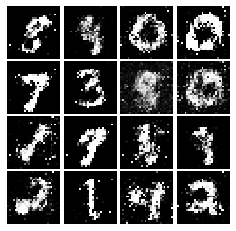

Epoch: 6, Iter: 2940, D: 1.378, G:0.8212


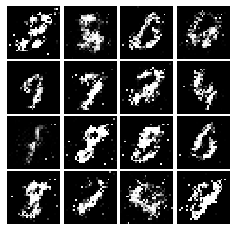

Epoch: 6, Iter: 2960, D: 1.36, G:0.8177


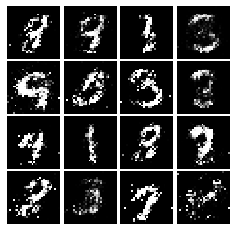

Epoch: 6, Iter: 2980, D: 1.358, G:0.8833


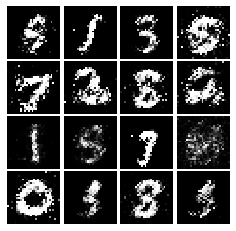

Epoch: 6, Iter: 3000, D: 1.389, G:0.8244


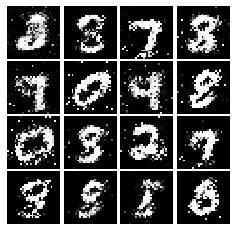

Epoch: 6, Iter: 3020, D: 1.361, G:0.7174


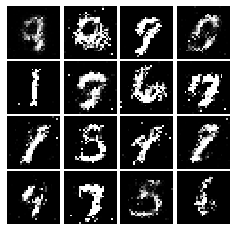

Epoch: 6, Iter: 3040, D: 1.351, G:0.8118


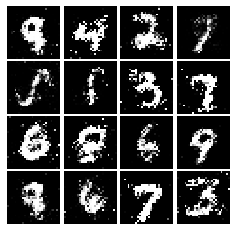

Epoch: 6, Iter: 3060, D: 1.359, G:0.7278


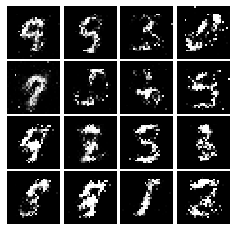

Epoch: 6, Iter: 3080, D: 1.347, G:0.8415


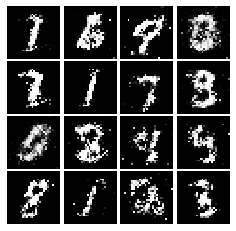

Epoch: 6, Iter: 3100, D: 1.298, G:0.8016


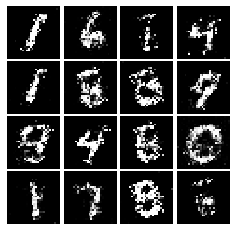

Epoch: 6, Iter: 3120, D: 1.278, G:0.9265


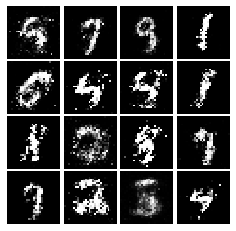

Epoch: 6, Iter: 3140, D: 1.301, G:0.7554


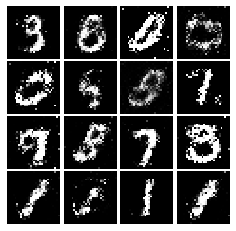

Epoch: 6, Iter: 3160, D: 1.331, G:0.8496


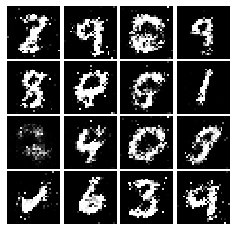

Epoch: 6, Iter: 3180, D: 1.278, G:0.6716


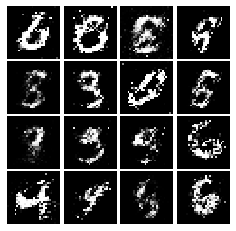

Epoch: 6, Iter: 3200, D: 1.313, G:0.7903


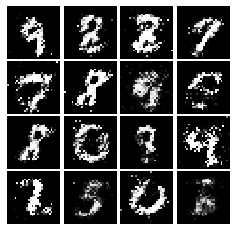

Epoch: 6, Iter: 3220, D: 1.328, G:0.7927


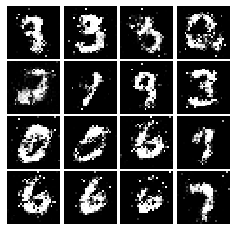

Epoch: 6, Iter: 3240, D: 1.277, G:0.7104


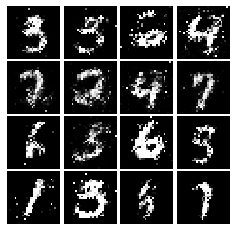

Epoch: 6, Iter: 3260, D: 1.397, G:0.7676


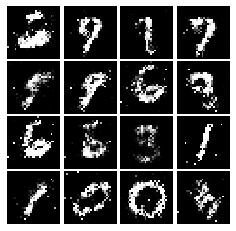

Epoch: 6, Iter: 3280, D: 1.32, G:0.7654


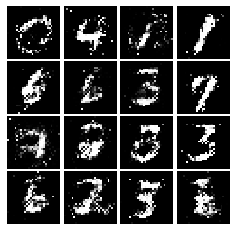

Epoch: 7, Iter: 3300, D: 1.324, G:0.7434


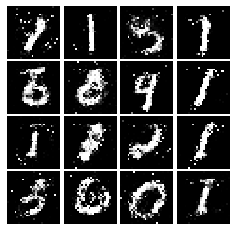

Epoch: 7, Iter: 3320, D: 1.341, G:0.9025


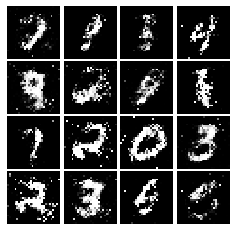

Epoch: 7, Iter: 3340, D: 1.37, G:0.8317


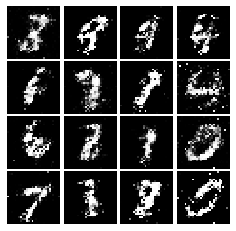

Epoch: 7, Iter: 3360, D: 1.391, G:0.8589


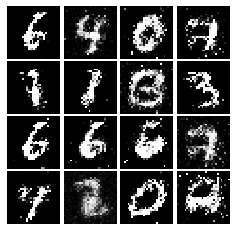

Epoch: 7, Iter: 3380, D: 1.345, G:0.8056


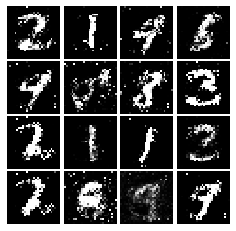

Epoch: 7, Iter: 3400, D: 1.391, G:0.8106


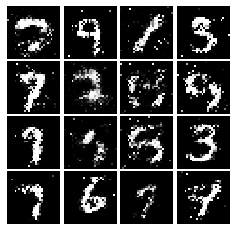

Epoch: 7, Iter: 3420, D: 1.314, G:0.7403


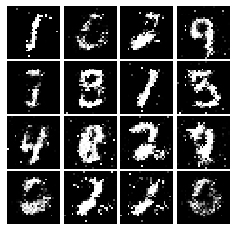

Epoch: 7, Iter: 3440, D: 1.322, G:0.7338


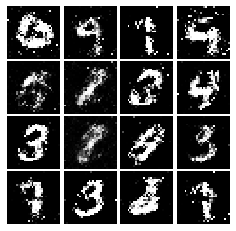

Epoch: 7, Iter: 3460, D: 1.26, G:0.7893


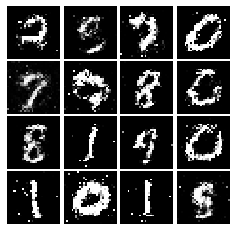

Epoch: 7, Iter: 3480, D: 1.266, G:0.7614


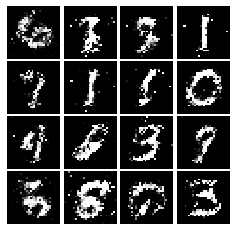

Epoch: 7, Iter: 3500, D: 1.333, G:0.7634


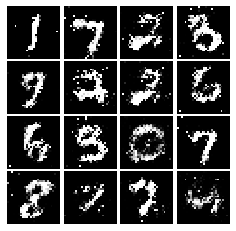

Epoch: 7, Iter: 3520, D: 1.215, G:0.7916


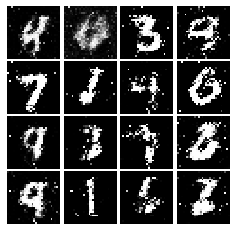

Epoch: 7, Iter: 3540, D: 1.238, G:0.8845


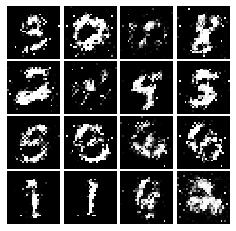

Epoch: 7, Iter: 3560, D: 1.199, G:0.8059


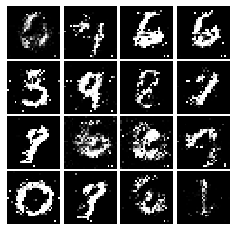

Epoch: 7, Iter: 3580, D: 1.391, G:0.7985


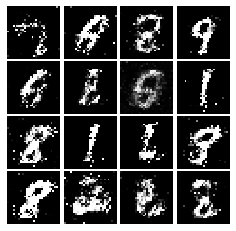

Epoch: 7, Iter: 3600, D: 1.3, G:0.8474


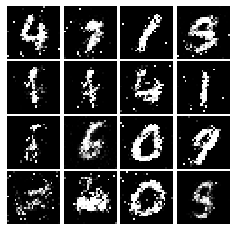

Epoch: 7, Iter: 3620, D: 1.336, G:0.9832


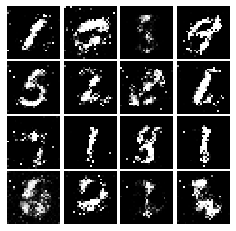

Epoch: 7, Iter: 3640, D: 1.291, G:0.7706


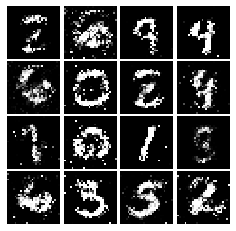

Epoch: 7, Iter: 3660, D: 1.388, G:0.9158


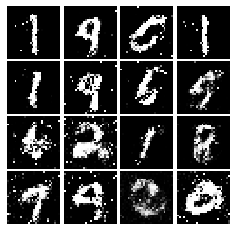

Epoch: 7, Iter: 3680, D: 1.289, G:0.8426


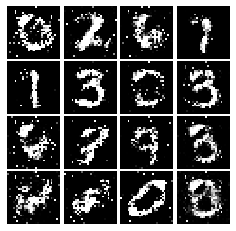

Epoch: 7, Iter: 3700, D: 1.334, G:0.8468


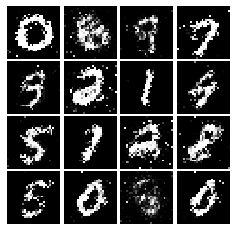

Epoch: 7, Iter: 3720, D: 1.419, G:0.7448


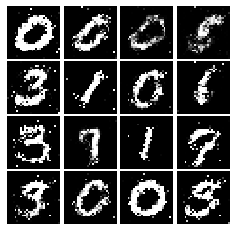

Epoch: 7, Iter: 3740, D: 1.275, G:0.6768


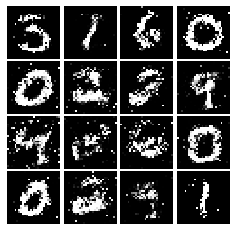

Epoch: 8, Iter: 3760, D: 1.364, G:0.8744


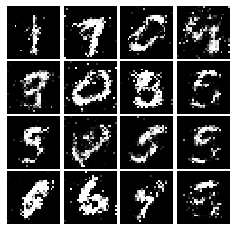

Epoch: 8, Iter: 3780, D: 1.297, G:0.7429


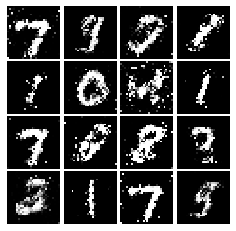

Epoch: 8, Iter: 3800, D: 1.294, G:0.923


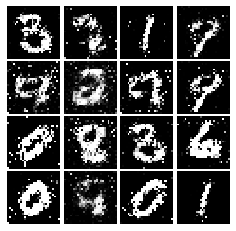

Epoch: 8, Iter: 3820, D: 1.333, G:0.8511


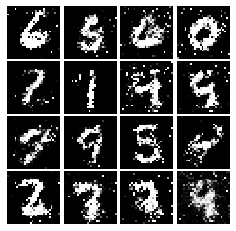

Epoch: 8, Iter: 3840, D: 1.376, G:0.8046


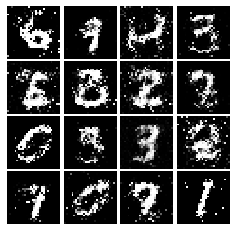

Epoch: 8, Iter: 3860, D: 1.28, G:0.8595


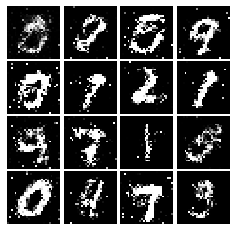

Epoch: 8, Iter: 3880, D: 1.333, G:0.8227


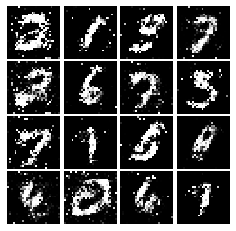

Epoch: 8, Iter: 3900, D: 1.35, G:0.7404


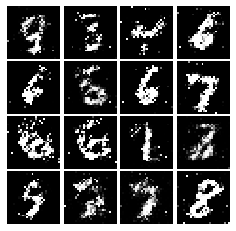

Epoch: 8, Iter: 3920, D: 1.364, G:0.7736


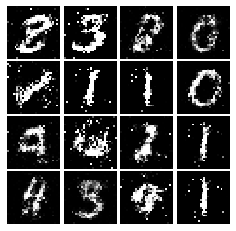

Epoch: 8, Iter: 3940, D: 1.382, G:0.7731


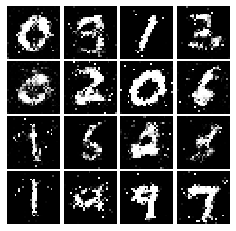

Epoch: 8, Iter: 3960, D: 1.304, G:0.7418


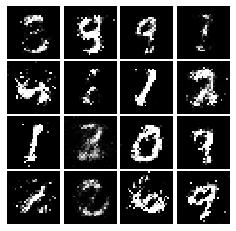

Epoch: 8, Iter: 3980, D: 1.357, G:0.7385


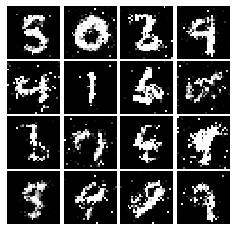

Epoch: 8, Iter: 4000, D: 1.306, G:0.7307


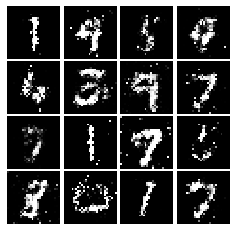

Epoch: 8, Iter: 4020, D: 1.374, G:0.8221


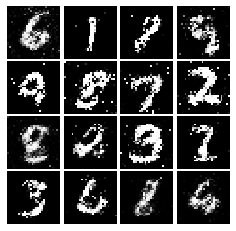

Epoch: 8, Iter: 4040, D: 1.36, G:0.8104


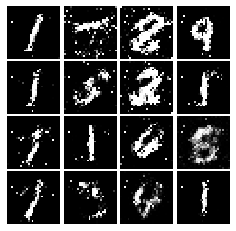

Epoch: 8, Iter: 4060, D: 1.266, G:0.7845


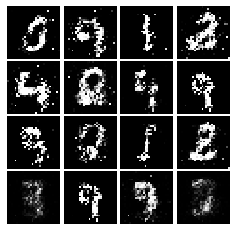

Epoch: 8, Iter: 4080, D: 1.387, G:0.8654


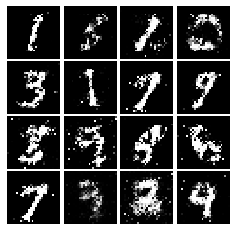

Epoch: 8, Iter: 4100, D: 1.272, G:0.7071


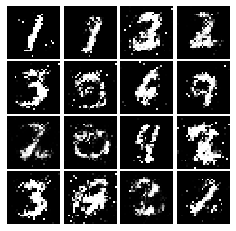

Epoch: 8, Iter: 4120, D: 1.308, G:0.8742


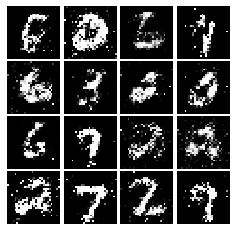

Epoch: 8, Iter: 4140, D: 1.354, G:0.8818


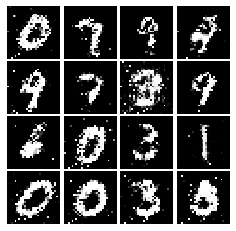

Epoch: 8, Iter: 4160, D: 1.323, G:0.8047


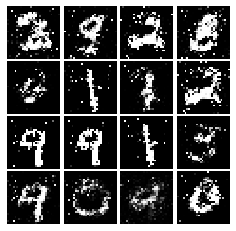

Epoch: 8, Iter: 4180, D: 1.375, G:0.7913


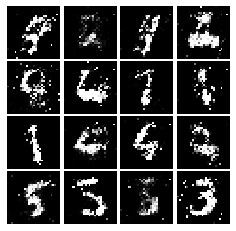

Epoch: 8, Iter: 4200, D: 1.36, G:0.8564


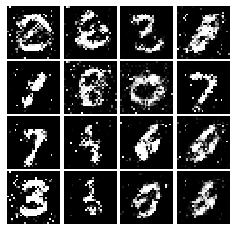

Epoch: 8, Iter: 4220, D: 1.353, G:0.7897


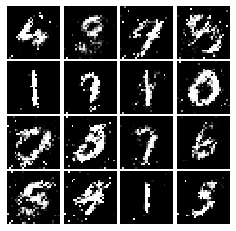

Epoch: 9, Iter: 4240, D: 1.331, G:0.8719


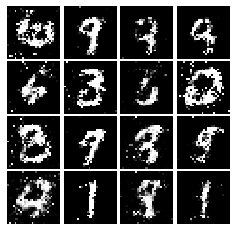

Epoch: 9, Iter: 4260, D: 1.373, G:0.8942


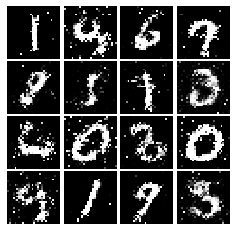

Epoch: 9, Iter: 4280, D: 1.363, G:0.8215


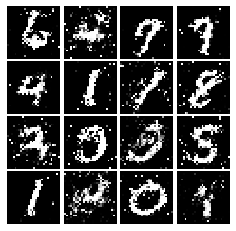

Epoch: 9, Iter: 4300, D: 1.376, G:0.8359


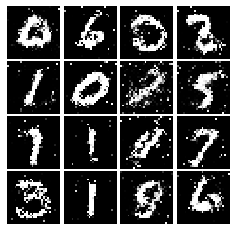

Epoch: 9, Iter: 4320, D: 1.345, G:0.8195


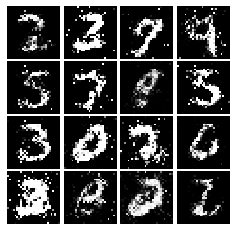

Epoch: 9, Iter: 4340, D: 1.376, G:0.8362


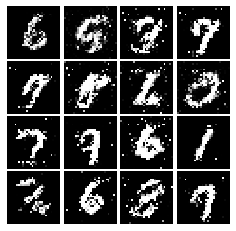

Epoch: 9, Iter: 4360, D: 1.329, G:0.8643


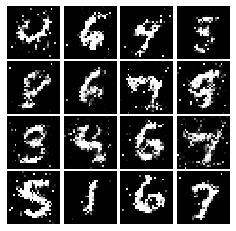

Epoch: 9, Iter: 4380, D: 1.388, G:0.7861


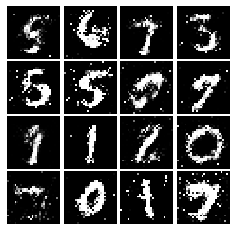

Epoch: 9, Iter: 4400, D: 1.257, G:0.8629


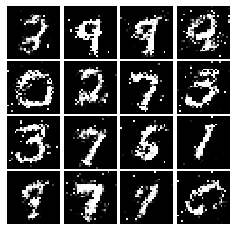

Epoch: 9, Iter: 4420, D: 1.282, G:0.7811


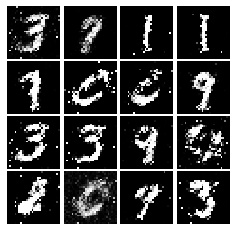

Epoch: 9, Iter: 4440, D: 1.312, G:0.7654


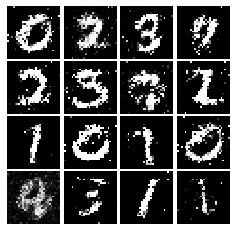

Epoch: 9, Iter: 4460, D: 1.316, G:0.8401


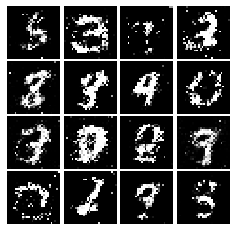

Epoch: 9, Iter: 4480, D: 1.304, G:0.8363


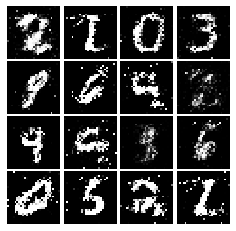

Epoch: 9, Iter: 4500, D: 1.376, G:0.8927


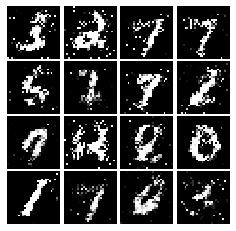

Epoch: 9, Iter: 4520, D: 1.3, G:0.8392


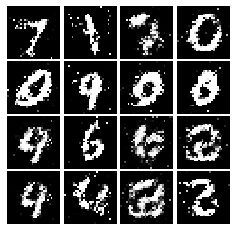

Epoch: 9, Iter: 4540, D: 1.336, G:0.9231


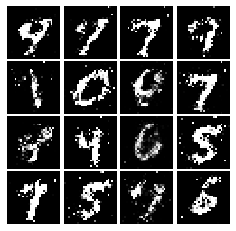

Epoch: 9, Iter: 4560, D: 1.391, G:0.8612


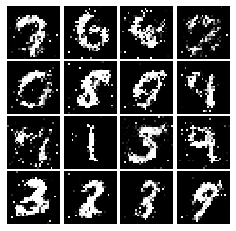

Epoch: 9, Iter: 4580, D: 1.411, G:0.8294


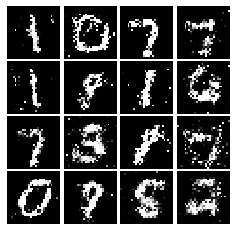

Epoch: 9, Iter: 4600, D: 1.358, G:0.8302


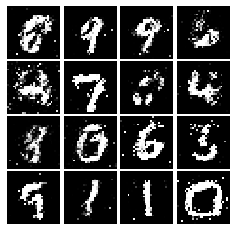

Epoch: 9, Iter: 4620, D: 1.282, G:0.8358


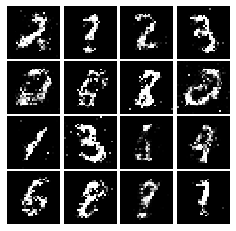

Epoch: 9, Iter: 4640, D: 1.361, G:0.8149


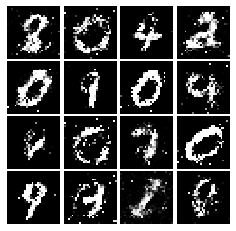

Epoch: 9, Iter: 4660, D: 1.317, G:0.841


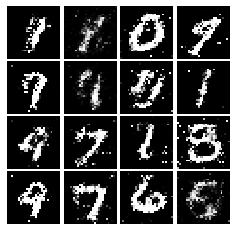

Epoch: 9, Iter: 4680, D: 1.368, G:0.8694


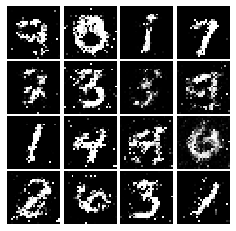

Final images


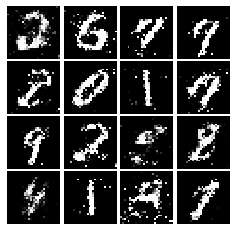

In [31]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [36]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss_real = tf.reduce_mean(tf.square(scores_real - 1))
    loss_fake = tf.reduce_mean(tf.square(scores_fake))
    
    loss = 0.5 * (loss_real + loss_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - 1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [37]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.2243, G:0.3923


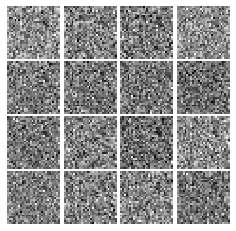

Epoch: 0, Iter: 20, D: 0.06407, G:0.8105


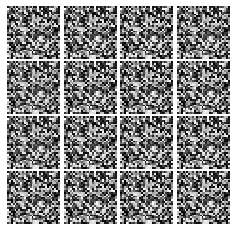

Epoch: 0, Iter: 40, D: 0.009974, G:0.6442


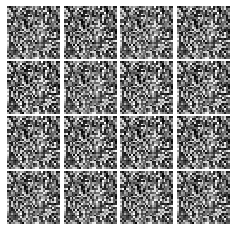

Epoch: 0, Iter: 60, D: 0.009432, G:0.6405


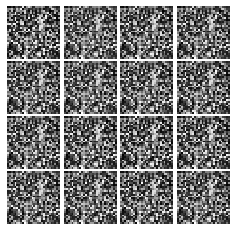

Epoch: 0, Iter: 80, D: 0.01298, G:0.882


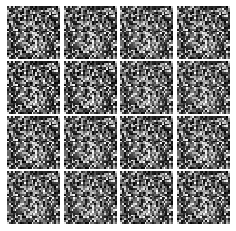

Epoch: 0, Iter: 100, D: 0.165, G:0.45


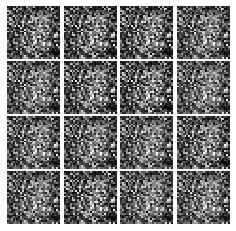

Epoch: 0, Iter: 120, D: 0.2412, G:0.7174


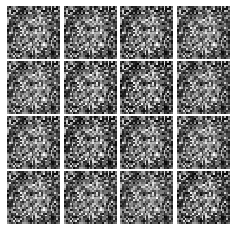

Epoch: 0, Iter: 140, D: 0.1421, G:0.3956


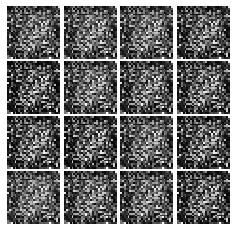

Epoch: 0, Iter: 160, D: 0.413, G:0.5913


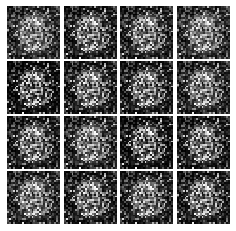

Epoch: 0, Iter: 180, D: 0.0764, G:0.327


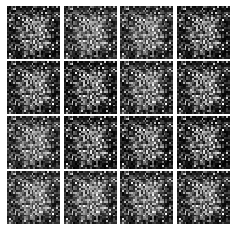

Epoch: 0, Iter: 200, D: 0.2839, G:0.1505


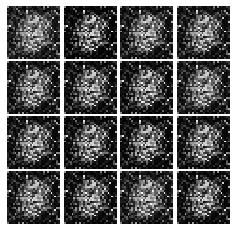

Epoch: 0, Iter: 220, D: 0.1346, G:0.3278


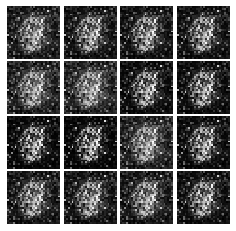

Epoch: 0, Iter: 240, D: 0.178, G:0.4849


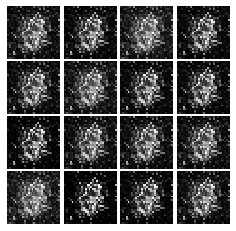

Epoch: 0, Iter: 260, D: 0.1292, G:0.3513


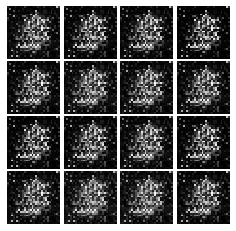

Epoch: 0, Iter: 280, D: 0.2563, G:1.042


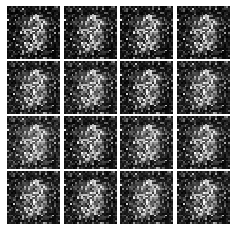

Epoch: 0, Iter: 300, D: 0.2243, G:0.6396


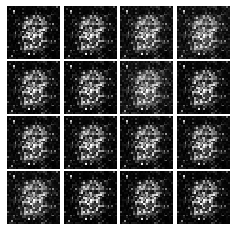

Epoch: 0, Iter: 320, D: 0.2384, G:0.7645


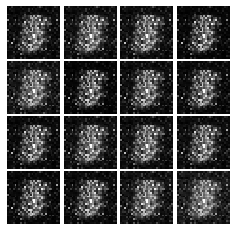

Epoch: 0, Iter: 340, D: 0.1481, G:0.586


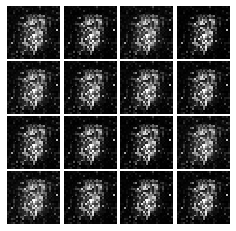

Epoch: 0, Iter: 360, D: 0.0762, G:0.7047


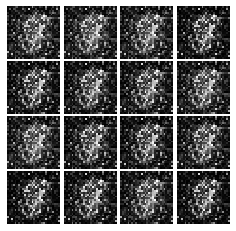

Epoch: 0, Iter: 380, D: 0.1207, G:0.4404


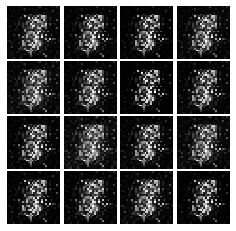

Epoch: 0, Iter: 400, D: 0.1065, G:0.4771


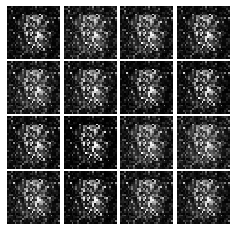

Epoch: 0, Iter: 420, D: 0.07801, G:0.7145


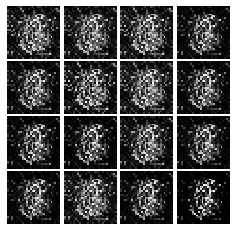

Epoch: 0, Iter: 440, D: 0.1374, G:0.4548


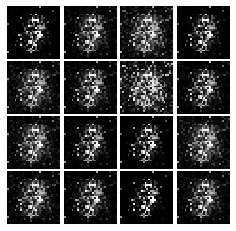

Epoch: 0, Iter: 460, D: 0.1427, G:0.4749


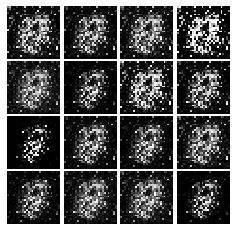

Epoch: 1, Iter: 480, D: 0.08927, G:0.4605


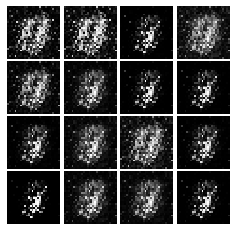

Epoch: 1, Iter: 500, D: 0.5909, G:0.1316


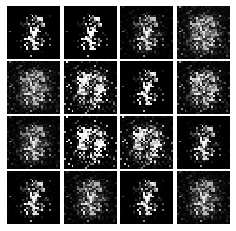

Epoch: 1, Iter: 520, D: 0.1001, G:0.3241


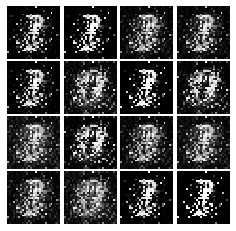

Epoch: 1, Iter: 540, D: 0.1274, G:0.7755


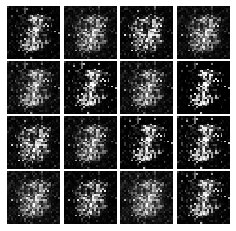

Epoch: 1, Iter: 560, D: 0.1401, G:0.3755


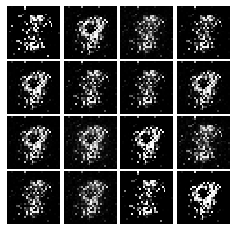

Epoch: 1, Iter: 580, D: 0.08507, G:0.4012


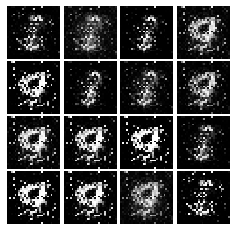

Epoch: 1, Iter: 600, D: 0.1174, G:0.3725


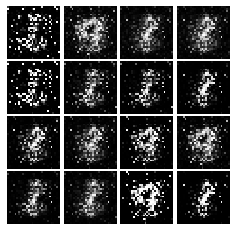

Epoch: 1, Iter: 620, D: 0.07169, G:0.4267


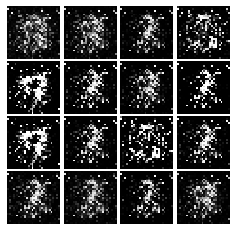

Epoch: 1, Iter: 640, D: 0.1308, G:0.09412


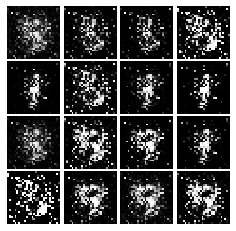

Epoch: 1, Iter: 660, D: 0.09281, G:0.5686


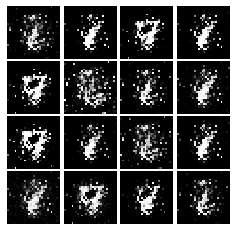

Epoch: 1, Iter: 680, D: 0.09763, G:0.4619


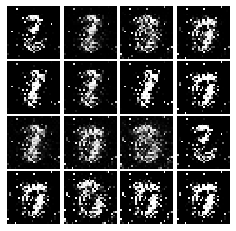

Epoch: 1, Iter: 700, D: 0.1037, G:0.3967


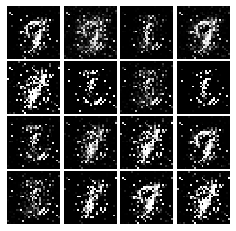

Epoch: 1, Iter: 720, D: 0.1657, G:0.6618


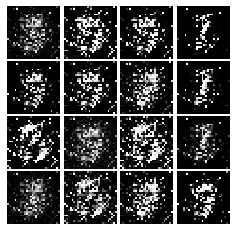

Epoch: 1, Iter: 740, D: 0.09426, G:0.3739


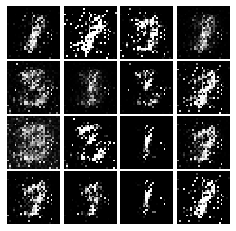

Epoch: 1, Iter: 760, D: 0.1035, G:0.4682


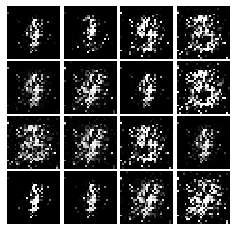

Epoch: 1, Iter: 780, D: 0.1814, G:0.6541


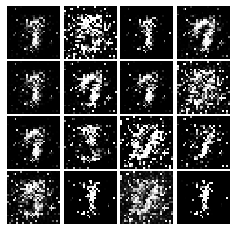

Epoch: 1, Iter: 800, D: 0.08939, G:0.4955


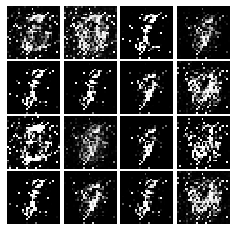

Epoch: 1, Iter: 820, D: 0.1052, G:0.4554


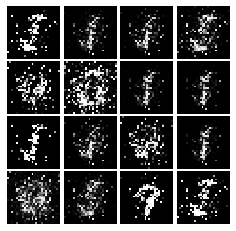

Epoch: 1, Iter: 840, D: 0.08715, G:0.3226


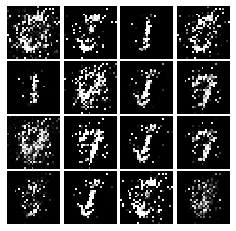

Epoch: 1, Iter: 860, D: 0.1285, G:0.3899


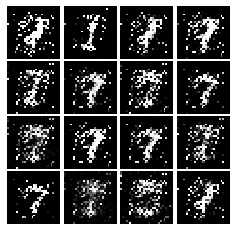

Epoch: 1, Iter: 880, D: 0.1068, G:0.4504


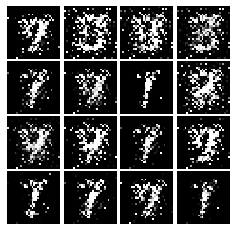

Epoch: 1, Iter: 900, D: 0.1353, G:0.5442


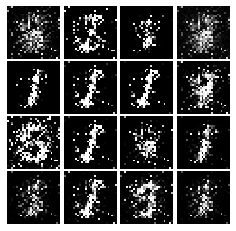

Epoch: 1, Iter: 920, D: 0.2427, G:0.235


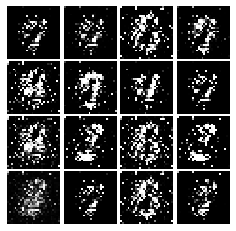

Epoch: 2, Iter: 940, D: 0.06848, G:0.59


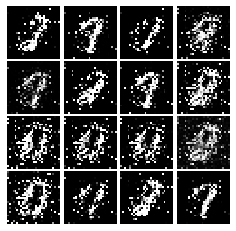

Epoch: 2, Iter: 960, D: 0.09839, G:0.3265


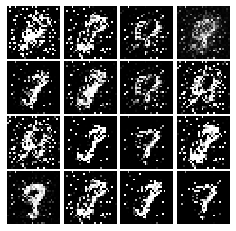

Epoch: 2, Iter: 980, D: 0.1217, G:0.4039


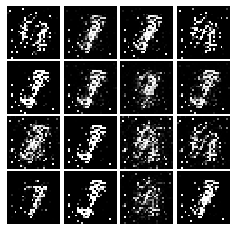

Epoch: 2, Iter: 1000, D: 0.08932, G:0.5969


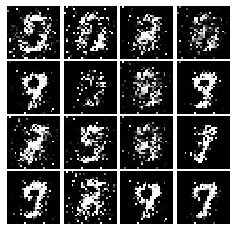

Epoch: 2, Iter: 1020, D: 0.1451, G:0.3436


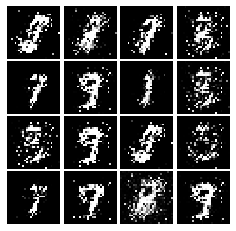

Epoch: 2, Iter: 1040, D: 0.2206, G:0.2325


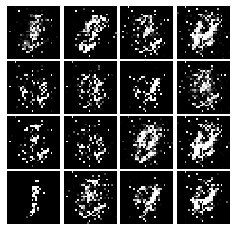

Epoch: 2, Iter: 1060, D: 0.1581, G:0.2389


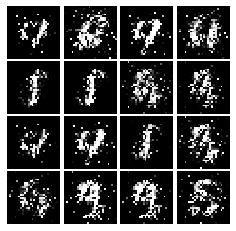

Epoch: 2, Iter: 1080, D: 0.1159, G:0.3509


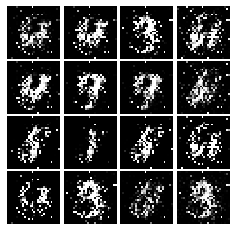

Epoch: 2, Iter: 1100, D: 0.108, G:0.3643


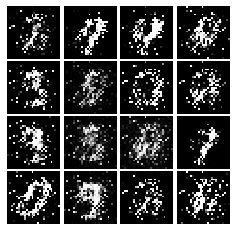

Epoch: 2, Iter: 1120, D: 0.1099, G:0.4822


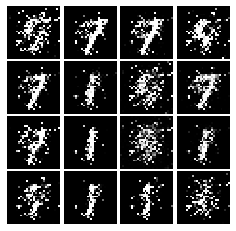

Epoch: 2, Iter: 1140, D: 0.1312, G:0.2815


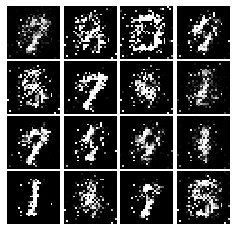

Epoch: 2, Iter: 1160, D: 0.1118, G:0.4042


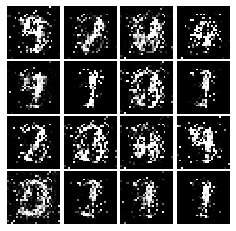

Epoch: 2, Iter: 1180, D: 0.1227, G:0.5825


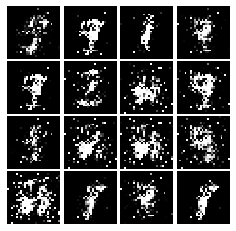

Epoch: 2, Iter: 1200, D: 0.137, G:0.2895


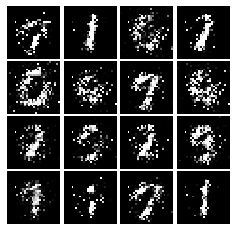

Epoch: 2, Iter: 1220, D: 0.1263, G:0.319


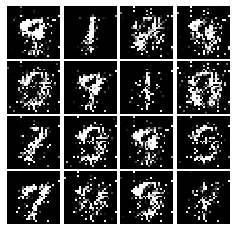

Epoch: 2, Iter: 1240, D: 0.1203, G:0.5474


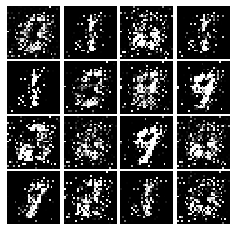

Epoch: 2, Iter: 1260, D: 0.1165, G:0.359


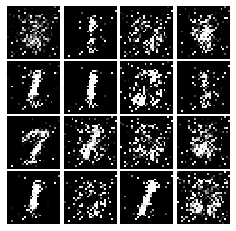

Epoch: 2, Iter: 1280, D: 0.1315, G:0.2961


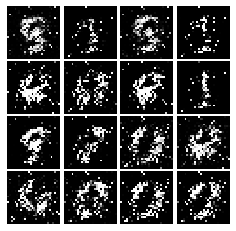

Epoch: 2, Iter: 1300, D: 0.1911, G:0.3461


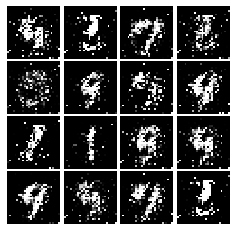

Epoch: 2, Iter: 1320, D: 0.1652, G:0.2514


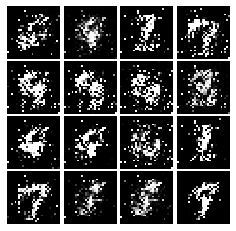

Epoch: 2, Iter: 1340, D: 0.1374, G:0.3393


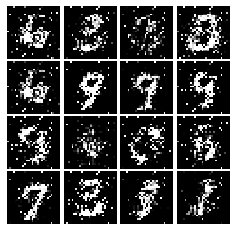

Epoch: 2, Iter: 1360, D: 0.1076, G:0.357


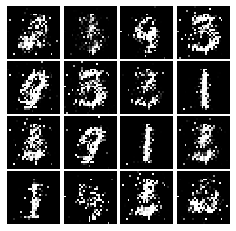

Epoch: 2, Iter: 1380, D: 0.1994, G:0.2379


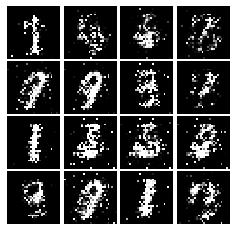

Epoch: 2, Iter: 1400, D: 0.1172, G:0.3727


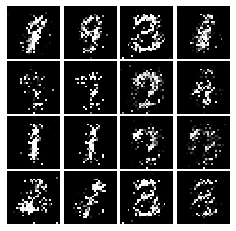

Epoch: 3, Iter: 1420, D: 0.1447, G:0.2572


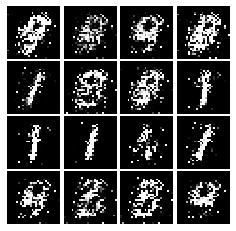

Epoch: 3, Iter: 1440, D: 0.1918, G:0.3495


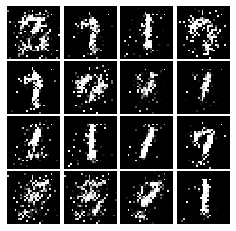

Epoch: 3, Iter: 1460, D: 0.2083, G:0.5208


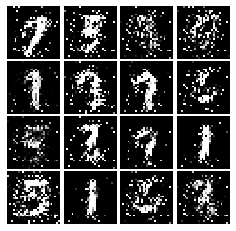

Epoch: 3, Iter: 1480, D: 0.1477, G:0.3322


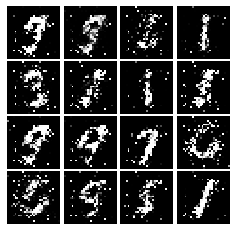

Epoch: 3, Iter: 1500, D: 0.1734, G:0.2858


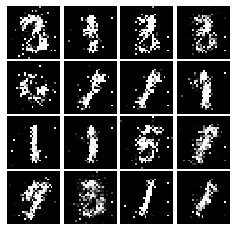

Epoch: 3, Iter: 1520, D: 0.227, G:0.1737


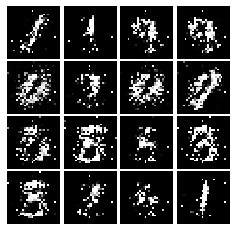

Epoch: 3, Iter: 1540, D: 0.1684, G:0.23


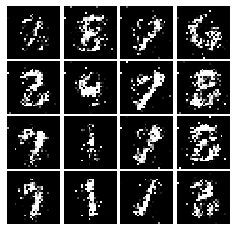

Epoch: 3, Iter: 1560, D: 0.1553, G:0.2782


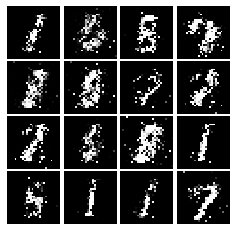

Epoch: 3, Iter: 1580, D: 0.1422, G:0.2697


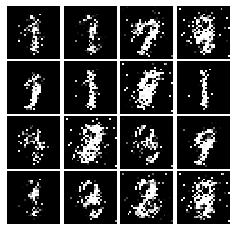

Epoch: 3, Iter: 1600, D: 0.1676, G:0.2362


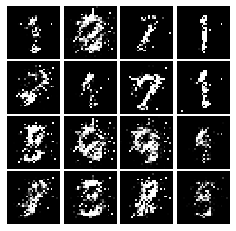

Epoch: 3, Iter: 1620, D: 0.1354, G:0.3284


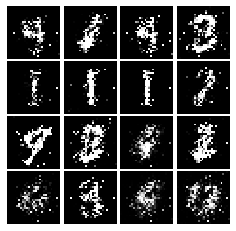

Epoch: 3, Iter: 1640, D: 0.1994, G:0.2203


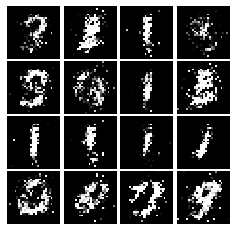

Epoch: 3, Iter: 1660, D: 0.1607, G:0.3483


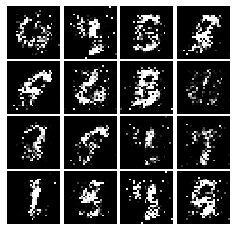

Epoch: 3, Iter: 1680, D: 0.1595, G:0.2488


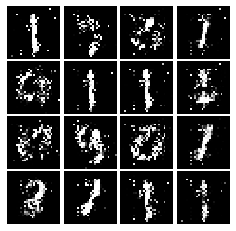

Epoch: 3, Iter: 1700, D: 0.1662, G:0.3365


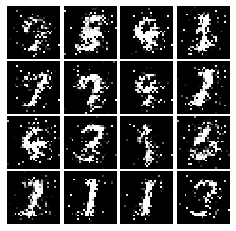

Epoch: 3, Iter: 1720, D: 0.1606, G:0.3112


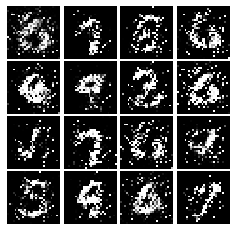

Epoch: 3, Iter: 1740, D: 0.1921, G:0.2658


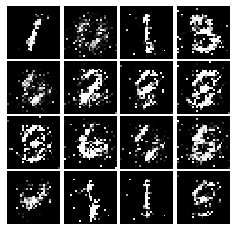

Epoch: 3, Iter: 1760, D: 0.2011, G:0.2662


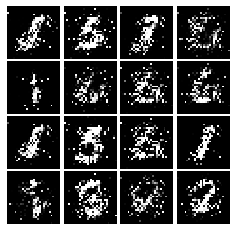

Epoch: 3, Iter: 1780, D: 0.1714, G:0.2626


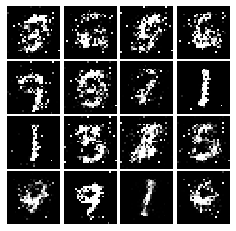

Epoch: 3, Iter: 1800, D: 0.211, G:0.2463


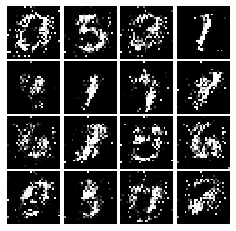

Epoch: 3, Iter: 1820, D: 0.2723, G:0.1092


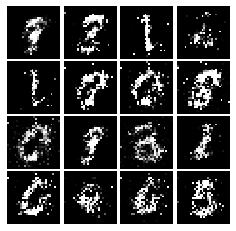

Epoch: 3, Iter: 1840, D: 0.2277, G:0.2125


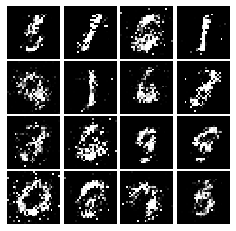

Epoch: 3, Iter: 1860, D: 0.2023, G:0.2135


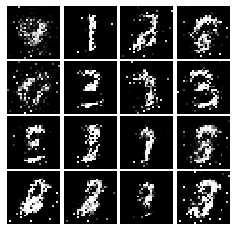

Epoch: 4, Iter: 1880, D: 0.248, G:0.2464


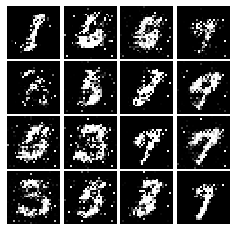

Epoch: 4, Iter: 1900, D: 0.203, G:0.2282


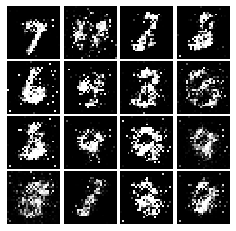

Epoch: 4, Iter: 1920, D: 0.2304, G:0.2683


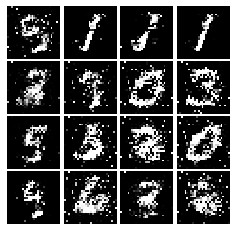

Epoch: 4, Iter: 1940, D: 0.2319, G:0.218


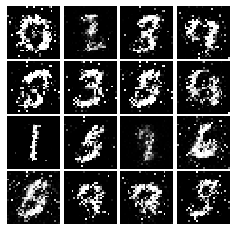

Epoch: 4, Iter: 1960, D: 0.1841, G:0.199


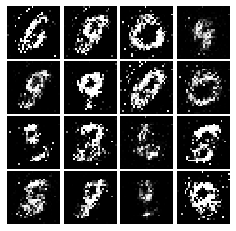

Epoch: 4, Iter: 1980, D: 0.1901, G:0.2139


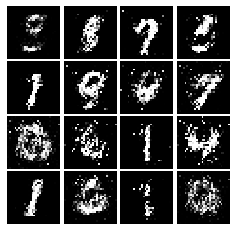

Epoch: 4, Iter: 2000, D: 0.2349, G:0.2161


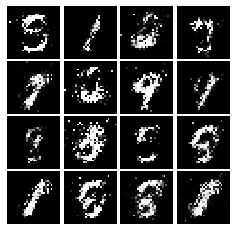

Epoch: 4, Iter: 2020, D: 0.2076, G:0.1784


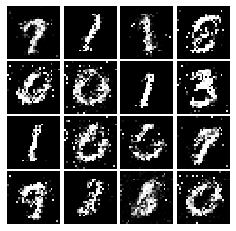

Epoch: 4, Iter: 2040, D: 0.2099, G:0.2132


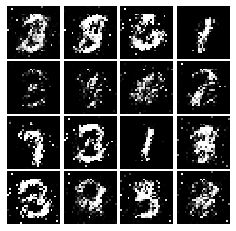

Epoch: 4, Iter: 2060, D: 0.24, G:0.2168


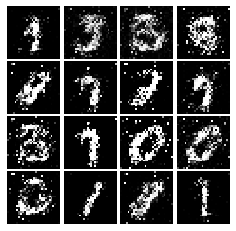

Epoch: 4, Iter: 2080, D: 0.2084, G:0.1869


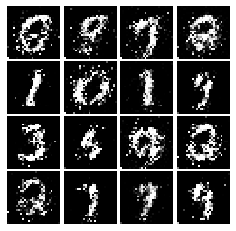

Epoch: 4, Iter: 2100, D: 0.236, G:0.1812


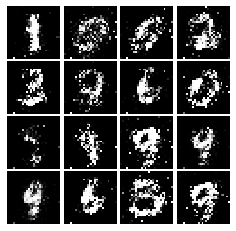

Epoch: 4, Iter: 2120, D: 0.2093, G:0.1988


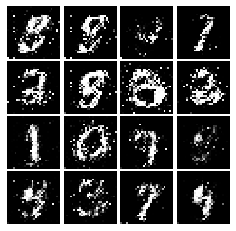

Epoch: 4, Iter: 2140, D: 0.2108, G:0.1914


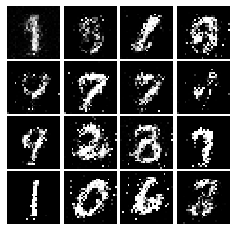

Epoch: 4, Iter: 2160, D: 0.2477, G:0.2046


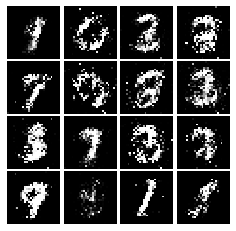

Epoch: 4, Iter: 2180, D: 0.2111, G:0.2147


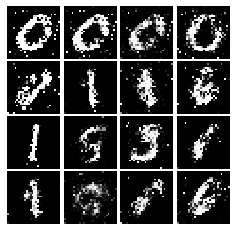

Epoch: 4, Iter: 2200, D: 0.197, G:0.2161


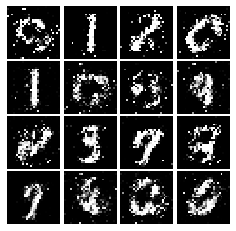

Epoch: 4, Iter: 2220, D: 0.2229, G:0.2153


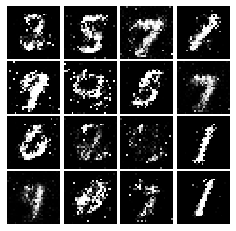

Epoch: 4, Iter: 2240, D: 0.2074, G:0.1874


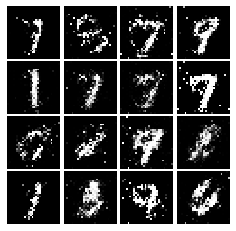

Epoch: 4, Iter: 2260, D: 0.2108, G:0.2299


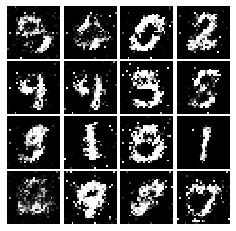

Epoch: 4, Iter: 2280, D: 0.2188, G:0.2126


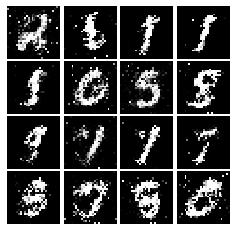

Epoch: 4, Iter: 2300, D: 0.2196, G:0.1907


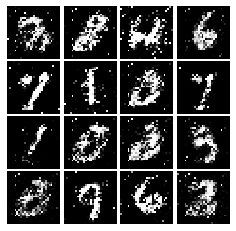

Epoch: 4, Iter: 2320, D: 0.2132, G:0.2145


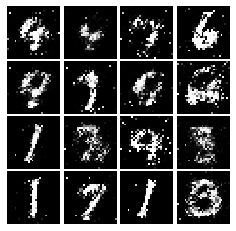

Epoch: 4, Iter: 2340, D: 0.2267, G:0.1925


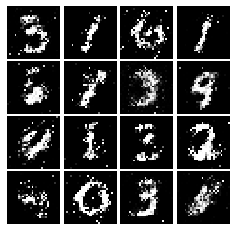

Epoch: 5, Iter: 2360, D: 0.2065, G:0.179


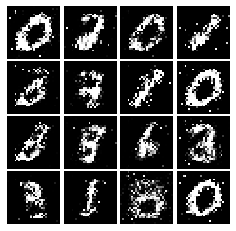

Epoch: 5, Iter: 2380, D: 0.2045, G:0.1839


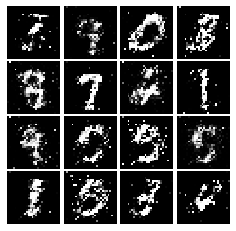

Epoch: 5, Iter: 2400, D: 0.2196, G:0.2281


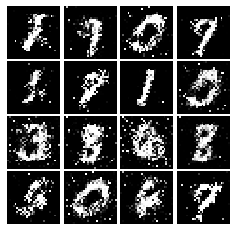

Epoch: 5, Iter: 2420, D: 0.1912, G:0.2219


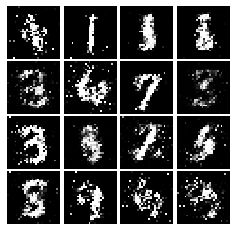

Epoch: 5, Iter: 2440, D: 0.2535, G:0.2011


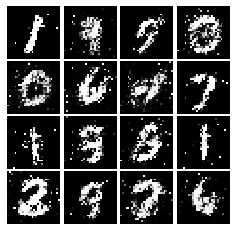

Epoch: 5, Iter: 2460, D: 0.2026, G:0.2181


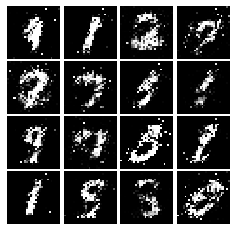

Epoch: 5, Iter: 2480, D: 0.2359, G:0.1609


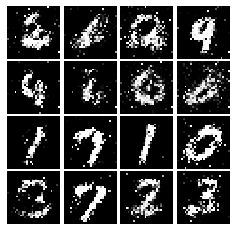

Epoch: 5, Iter: 2500, D: 0.2283, G:0.1987


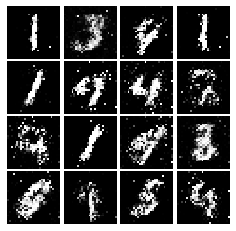

Epoch: 5, Iter: 2520, D: 0.2427, G:0.1854


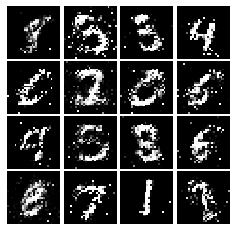

Epoch: 5, Iter: 2540, D: 0.2178, G:0.2139


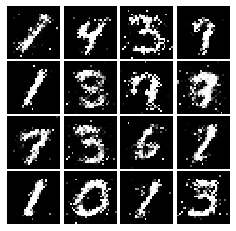

Epoch: 5, Iter: 2560, D: 0.2233, G:0.1922


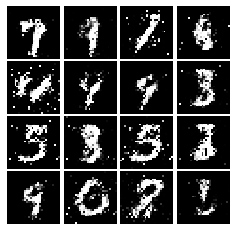

Epoch: 5, Iter: 2580, D: 0.2169, G:0.1937


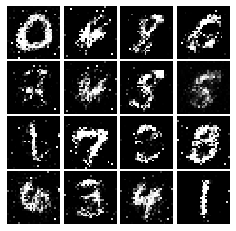

Epoch: 5, Iter: 2600, D: 0.2441, G:0.1333


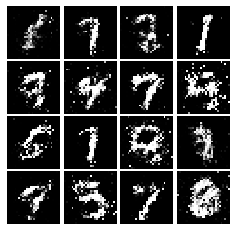

Epoch: 5, Iter: 2620, D: 0.2093, G:0.1959


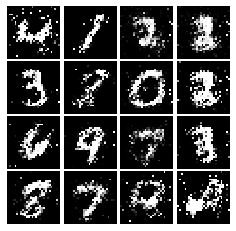

Epoch: 5, Iter: 2640, D: 0.237, G:0.1696


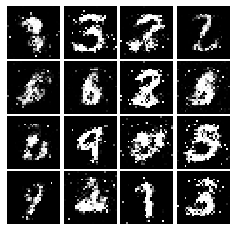

Epoch: 5, Iter: 2660, D: 0.2226, G:0.1546


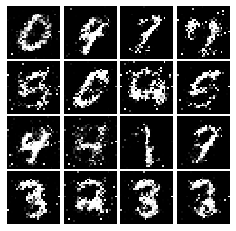

Epoch: 5, Iter: 2680, D: 0.2613, G:0.1798


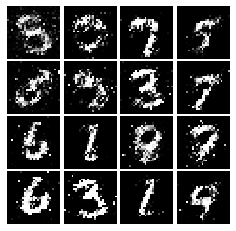

Epoch: 5, Iter: 2700, D: 0.2453, G:0.1805


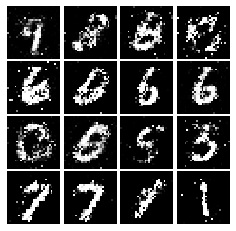

Epoch: 5, Iter: 2720, D: 0.2069, G:0.1879


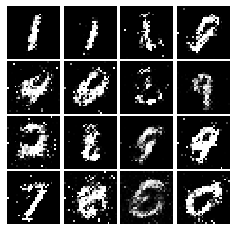

Epoch: 5, Iter: 2740, D: 0.2206, G:0.2167


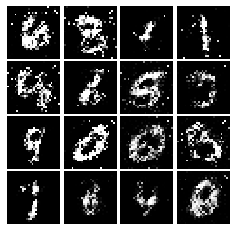

Epoch: 5, Iter: 2760, D: 0.2169, G:0.1676


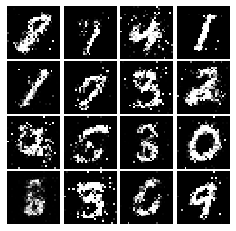

Epoch: 5, Iter: 2780, D: 0.2164, G:0.1446


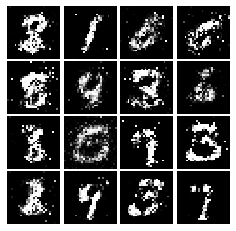

Epoch: 5, Iter: 2800, D: 0.204, G:0.2016


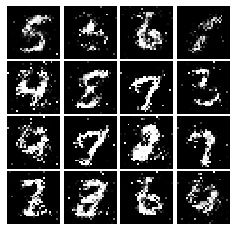

Epoch: 6, Iter: 2820, D: 0.2175, G:0.1877


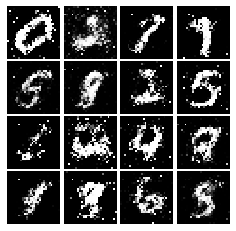

Epoch: 6, Iter: 2840, D: 0.2349, G:0.1876


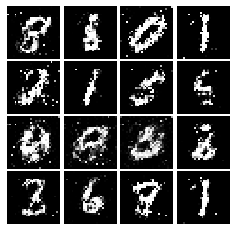

Epoch: 6, Iter: 2860, D: 0.202, G:0.1989


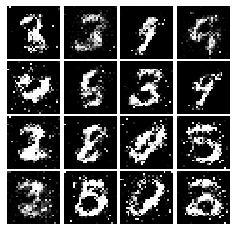

Epoch: 6, Iter: 2880, D: 0.2087, G:0.2108


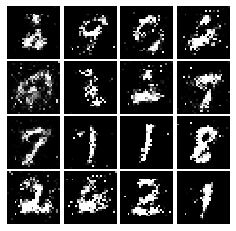

Epoch: 6, Iter: 2900, D: 0.1982, G:0.2021


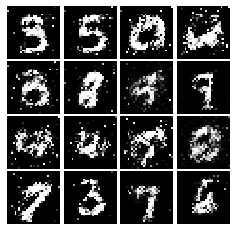

Epoch: 6, Iter: 2920, D: 0.2318, G:0.1971


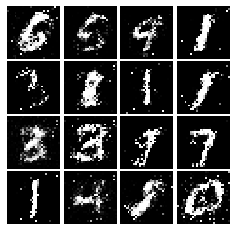

Epoch: 6, Iter: 2940, D: 0.2194, G:0.1751


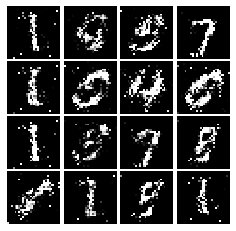

Epoch: 6, Iter: 2960, D: 0.2217, G:0.1929


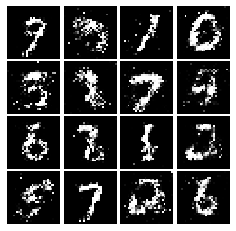

Epoch: 6, Iter: 2980, D: 0.2334, G:0.2164


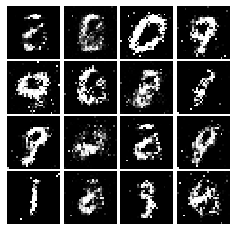

Epoch: 6, Iter: 3000, D: 0.228, G:0.2228


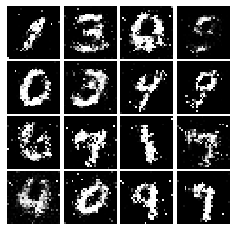

Epoch: 6, Iter: 3020, D: 0.2159, G:0.1817


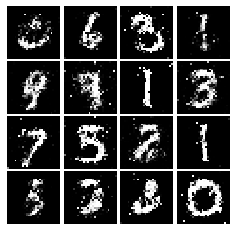

Epoch: 6, Iter: 3040, D: 0.2269, G:0.1754


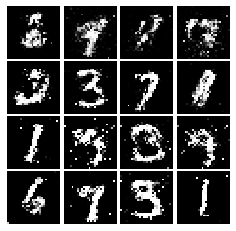

Epoch: 6, Iter: 3060, D: 0.2322, G:0.194


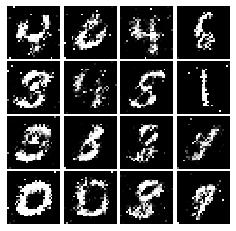

Epoch: 6, Iter: 3080, D: 0.2154, G:0.1704


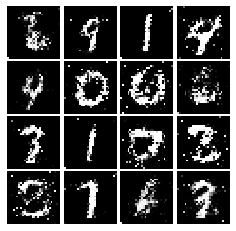

Epoch: 6, Iter: 3100, D: 0.2138, G:0.1762


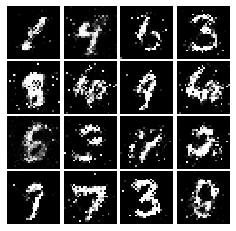

Epoch: 6, Iter: 3120, D: 0.2062, G:0.1514


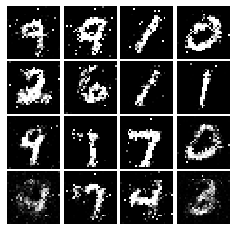

Epoch: 6, Iter: 3140, D: 0.2281, G:0.1781


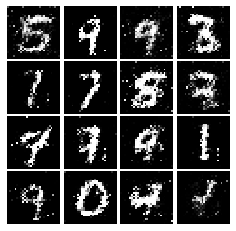

Epoch: 6, Iter: 3160, D: 0.2319, G:0.2084


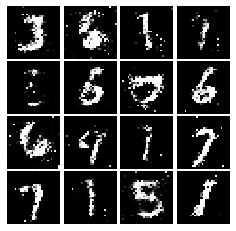

Epoch: 6, Iter: 3180, D: 0.1985, G:0.2259


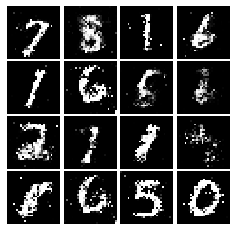

Epoch: 6, Iter: 3200, D: 0.2079, G:0.2034


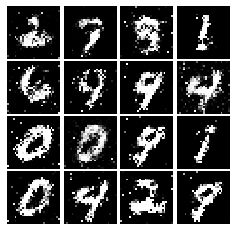

Epoch: 6, Iter: 3220, D: 0.2389, G:0.1643


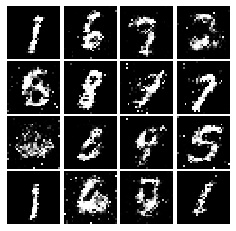

Epoch: 6, Iter: 3240, D: 0.217, G:0.1772


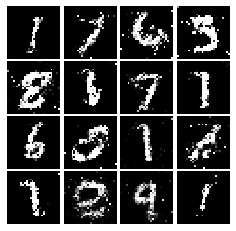

Epoch: 6, Iter: 3260, D: 0.2373, G:0.1941


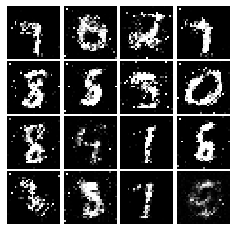

Epoch: 6, Iter: 3280, D: 0.23, G:0.2064


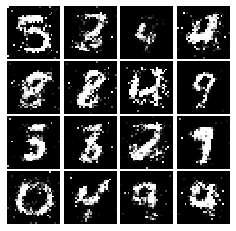

Epoch: 7, Iter: 3300, D: 0.2363, G:0.1879


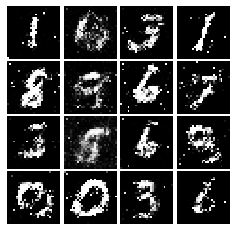

Epoch: 7, Iter: 3320, D: 0.2301, G:0.1822


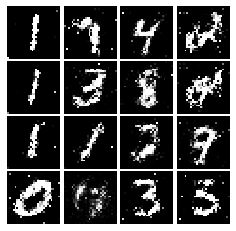

Epoch: 7, Iter: 3340, D: 0.2484, G:0.1966


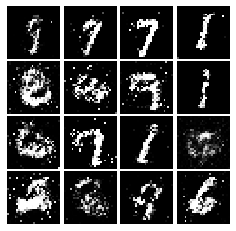

Epoch: 7, Iter: 3360, D: 0.235, G:0.1994


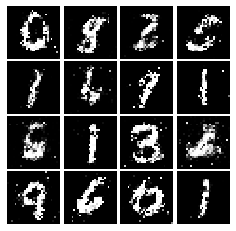

Epoch: 7, Iter: 3380, D: 0.2172, G:0.1863


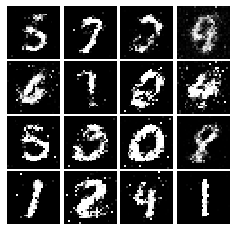

Epoch: 7, Iter: 3400, D: 0.2368, G:0.1462


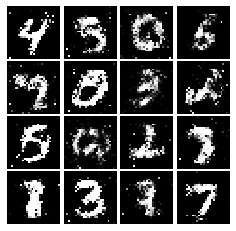

Epoch: 7, Iter: 3420, D: 0.2117, G:0.2037


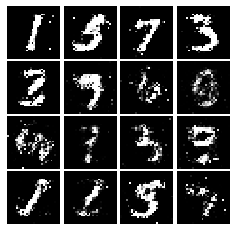

Epoch: 7, Iter: 3440, D: 0.2144, G:0.2019


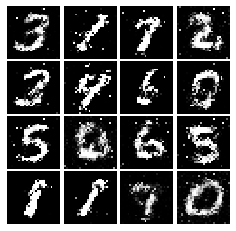

Epoch: 7, Iter: 3460, D: 0.1779, G:0.2383


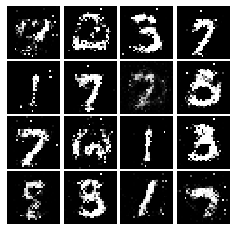

Epoch: 7, Iter: 3480, D: 0.2126, G:0.1688


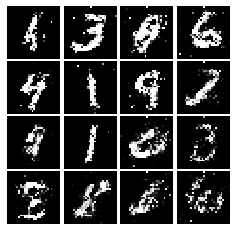

Epoch: 7, Iter: 3500, D: 0.2416, G:0.1654


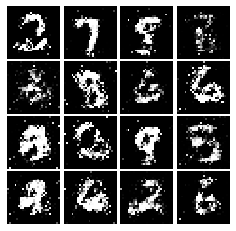

Epoch: 7, Iter: 3520, D: 0.2341, G:0.188


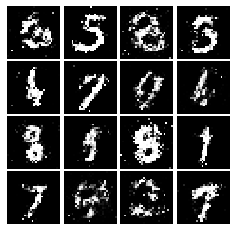

Epoch: 7, Iter: 3540, D: 0.206, G:0.1828


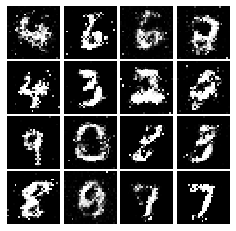

Epoch: 7, Iter: 3560, D: 0.2085, G:0.1905


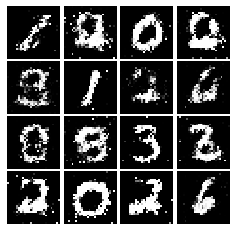

Epoch: 7, Iter: 3580, D: 0.2231, G:0.1707


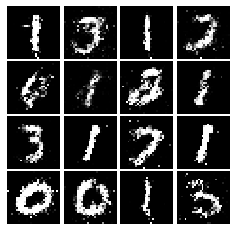

Epoch: 7, Iter: 3600, D: 0.2044, G:0.1693


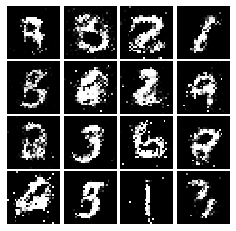

Epoch: 7, Iter: 3620, D: 0.2381, G:0.1553


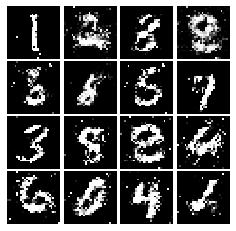

Epoch: 7, Iter: 3640, D: 0.2534, G:0.1814


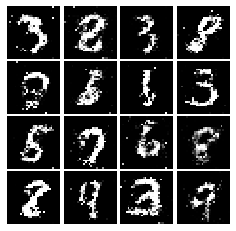

Epoch: 7, Iter: 3660, D: 0.2253, G:0.1566


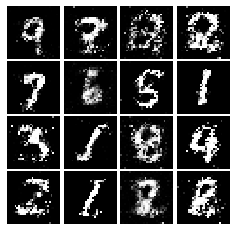

Epoch: 7, Iter: 3680, D: 0.2218, G:0.166


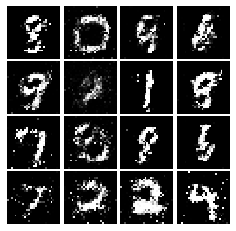

Epoch: 7, Iter: 3700, D: 0.2082, G:0.1971


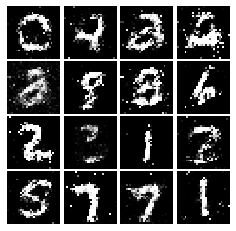

Epoch: 7, Iter: 3720, D: 0.2187, G:0.1922


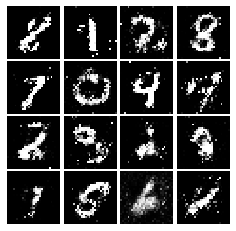

Epoch: 7, Iter: 3740, D: 0.2414, G:0.1497


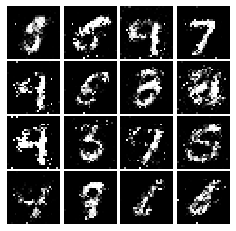

Epoch: 8, Iter: 3760, D: 0.2318, G:0.1689


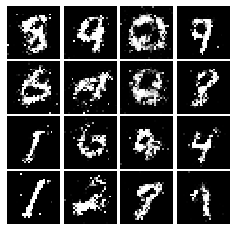

Epoch: 8, Iter: 3780, D: 0.2406, G:0.1593


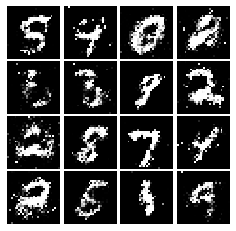

Epoch: 8, Iter: 3800, D: 0.2154, G:0.1626


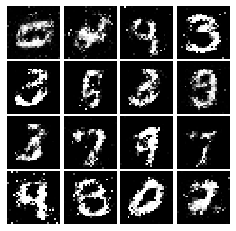

Epoch: 8, Iter: 3820, D: 0.2304, G:0.1635


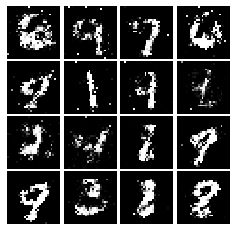

Epoch: 8, Iter: 3840, D: 0.2163, G:0.1527


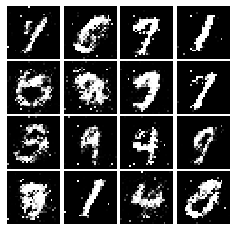

Epoch: 8, Iter: 3860, D: 0.2143, G:0.18


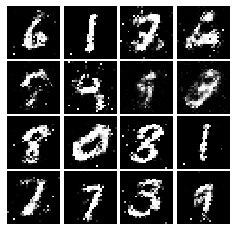

Epoch: 8, Iter: 3880, D: 0.2062, G:0.1605


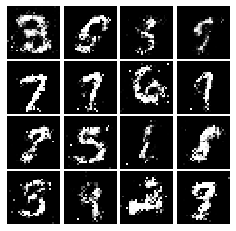

Epoch: 8, Iter: 3900, D: 0.2582, G:0.1672


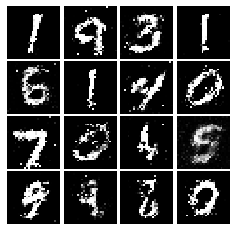

Epoch: 8, Iter: 3920, D: 0.2301, G:0.1817


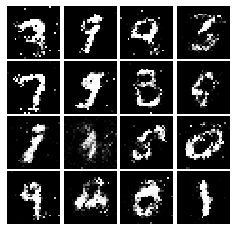

Epoch: 8, Iter: 3940, D: 0.2369, G:0.1702


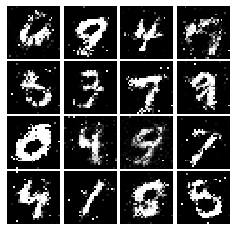

Epoch: 8, Iter: 3960, D: 0.2497, G:0.146


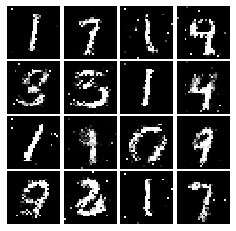

Epoch: 8, Iter: 3980, D: 0.2089, G:0.1704


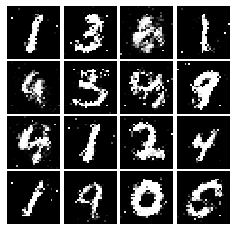

Epoch: 8, Iter: 4000, D: 0.2114, G:0.1911


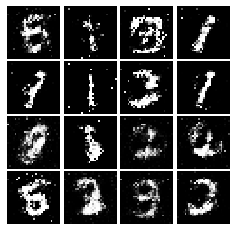

Epoch: 8, Iter: 4020, D: 0.2405, G:0.1631


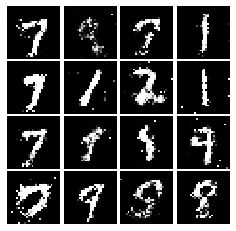

Epoch: 8, Iter: 4040, D: 0.2465, G:0.1617


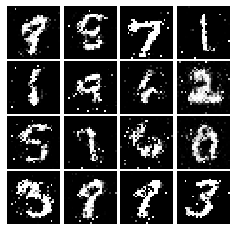

Epoch: 8, Iter: 4060, D: 0.2126, G:0.1828


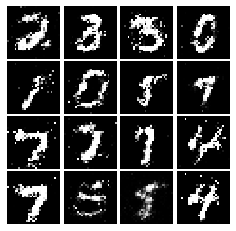

Epoch: 8, Iter: 4080, D: 0.2233, G:0.1708


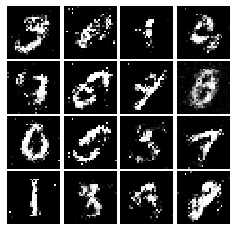

Epoch: 8, Iter: 4100, D: 0.2361, G:0.1663


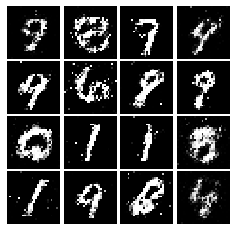

Epoch: 8, Iter: 4120, D: 0.2234, G:0.1631


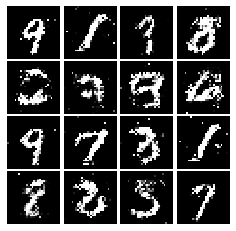

Epoch: 8, Iter: 4140, D: 0.2322, G:0.1941


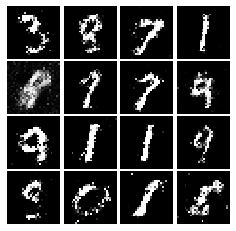

Epoch: 8, Iter: 4160, D: 0.2296, G:0.1732


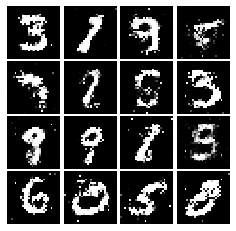

Epoch: 8, Iter: 4180, D: 0.2244, G:0.1887


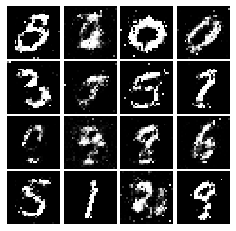

Epoch: 8, Iter: 4200, D: 0.2319, G:0.166


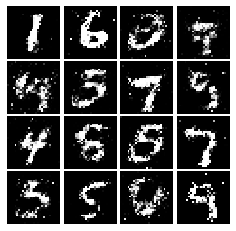

Epoch: 8, Iter: 4220, D: 0.1976, G:0.1743


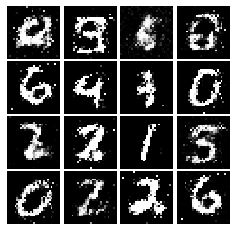

Epoch: 9, Iter: 4240, D: 0.2747, G:0.1621


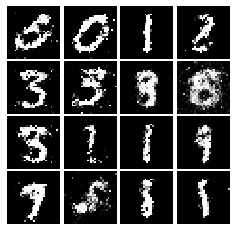

Epoch: 9, Iter: 4260, D: 0.2283, G:0.1488


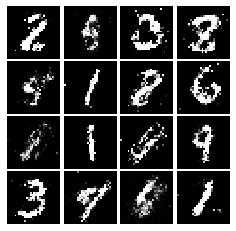

Epoch: 9, Iter: 4280, D: 0.2415, G:0.173


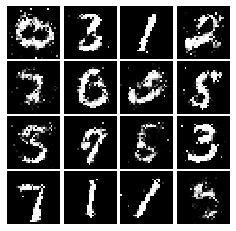

Epoch: 9, Iter: 4300, D: 0.2455, G:0.1718


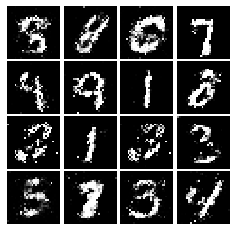

Epoch: 9, Iter: 4320, D: 0.2269, G:0.1578


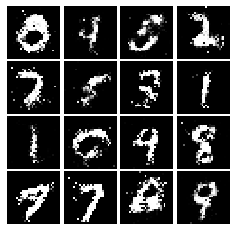

Epoch: 9, Iter: 4340, D: 0.2469, G:0.1819


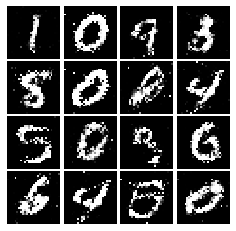

Epoch: 9, Iter: 4360, D: 0.2329, G:0.1719


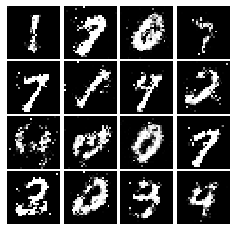

Epoch: 9, Iter: 4380, D: 0.2397, G:0.1711


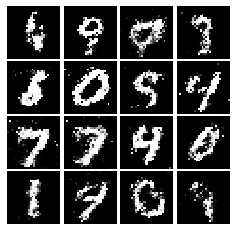

Epoch: 9, Iter: 4400, D: 0.2091, G:0.1992


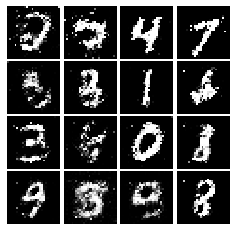

Epoch: 9, Iter: 4420, D: 0.2168, G:0.1943


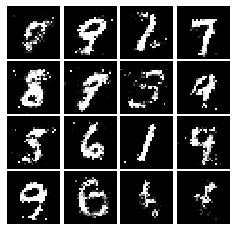

Epoch: 9, Iter: 4440, D: 0.2359, G:0.174


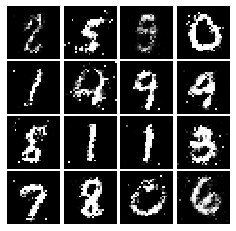

Epoch: 9, Iter: 4460, D: 0.2384, G:0.1779


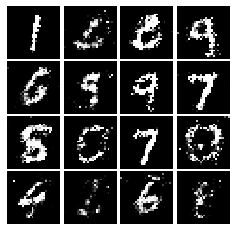

Epoch: 9, Iter: 4480, D: 0.2176, G:0.1943


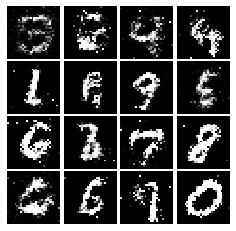

Epoch: 9, Iter: 4500, D: 0.2694, G:0.1561


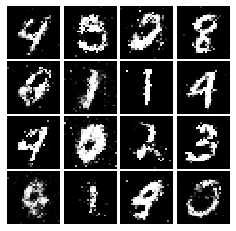

Epoch: 9, Iter: 4520, D: 0.2347, G:0.1505


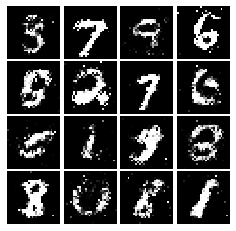

Epoch: 9, Iter: 4540, D: 0.2385, G:0.1757


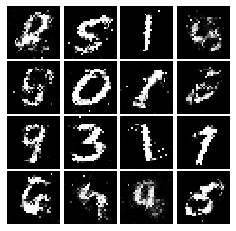

Epoch: 9, Iter: 4560, D: 0.2214, G:0.1826


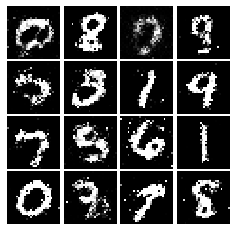

Epoch: 9, Iter: 4580, D: 0.2445, G:0.153


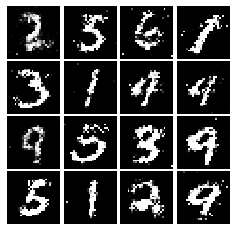

Epoch: 9, Iter: 4600, D: 0.2414, G:0.169


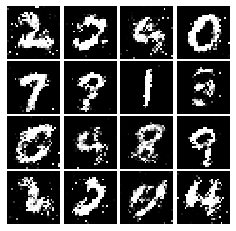

Epoch: 9, Iter: 4620, D: 0.2466, G:0.1686


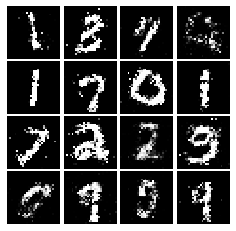

Epoch: 9, Iter: 4640, D: 0.2413, G:0.1722


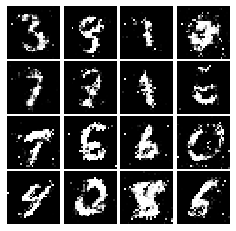

Epoch: 9, Iter: 4660, D: 0.242, G:0.1775


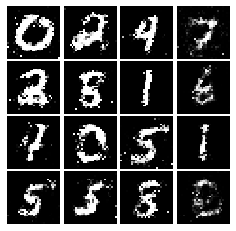

Epoch: 9, Iter: 4680, D: 0.2435, G:0.1613


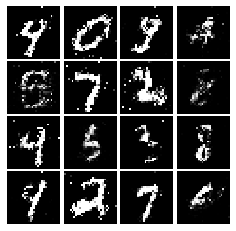

Final images


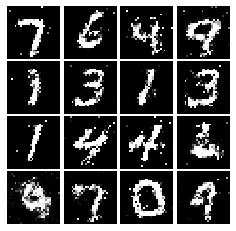

In [38]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [39]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32, (5, 5), strides = 1, padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2), strides = 2),
        tf.keras.layers.Conv2D(64, (5, 5), strides = 1, padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2), strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [40]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7 * 7 * 128, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7, 7, 128)),
        tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=(4,4),strides = 2,
                                        activation = tf.nn.relu, padding = 'SAME'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=(4,4), strides = 2,
                                        activation = tf.tanh, padding = 'SAME')
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])

    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.243, G:0.6462


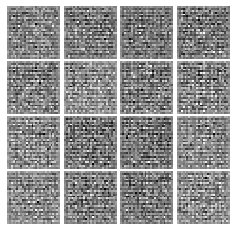

Epoch: 0, Iter: 20, D: 0.2802, G:1.635


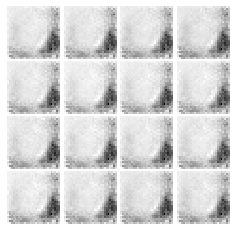

Epoch: 0, Iter: 40, D: 0.006102, G:5.213


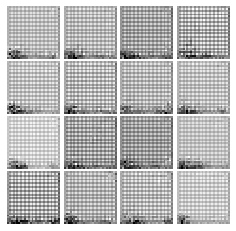

Epoch: 0, Iter: 60, D: 0.001685, G:6.455


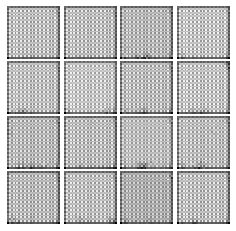

Epoch: 0, Iter: 80, D: 0.0008505, G:7.15


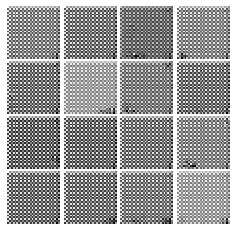

Epoch: 0, Iter: 100, D: 0.0004763, G:7.68


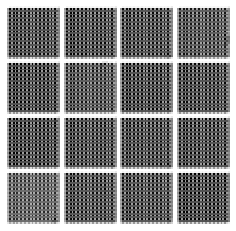

Epoch: 0, Iter: 120, D: 0.0003252, G:8.055


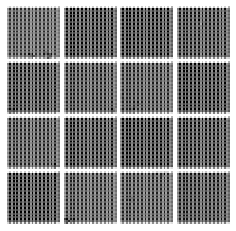

Epoch: 0, Iter: 140, D: 0.0002287, G:8.402


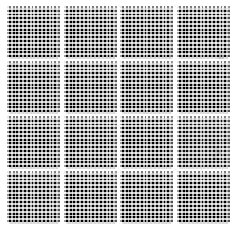

Epoch: 0, Iter: 160, D: 0.0001986, G:8.542


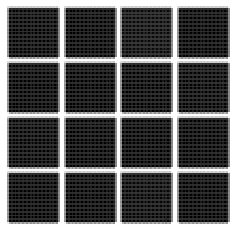

Epoch: 0, Iter: 180, D: 0.4576, G:1.27


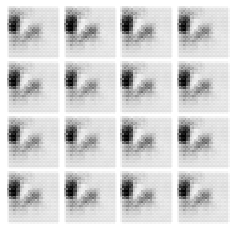

Epoch: 0, Iter: 200, D: 0.9068, G:1.09


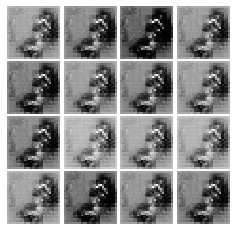

Epoch: 0, Iter: 220, D: 0.5356, G:1.933


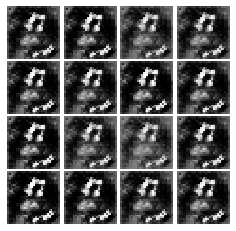

Epoch: 0, Iter: 240, D: 1.214, G:1.646


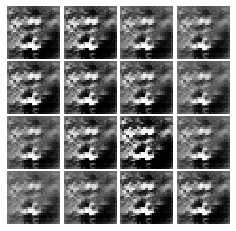

Epoch: 0, Iter: 260, D: 0.6587, G:2.582


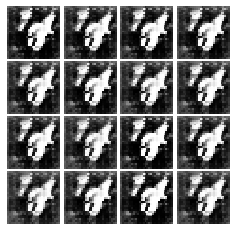

Epoch: 0, Iter: 280, D: 0.9287, G:1.395


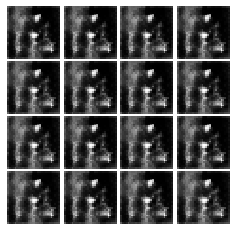

Epoch: 0, Iter: 300, D: 1.867, G:1.171


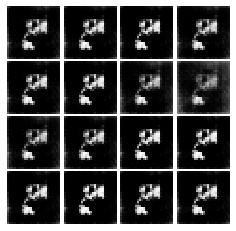

Epoch: 0, Iter: 320, D: 0.8458, G:1.992


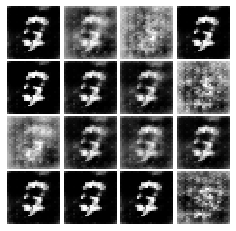

Epoch: 0, Iter: 340, D: 0.8178, G:1.749


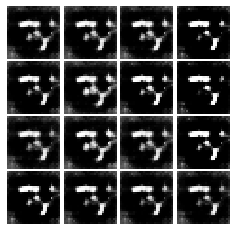

Epoch: 0, Iter: 360, D: 0.2901, G:3.121


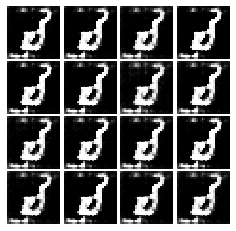

Epoch: 0, Iter: 380, D: 0.5918, G:3.206


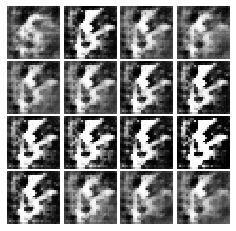

Epoch: 0, Iter: 400, D: 1.108, G:3.397


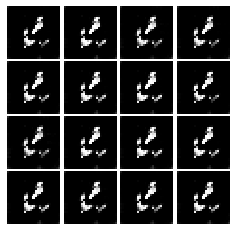

Epoch: 0, Iter: 420, D: 0.2189, G:3.53


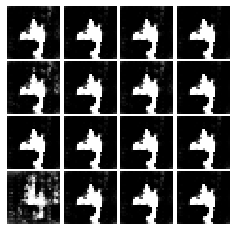

Epoch: 0, Iter: 440, D: 0.6153, G:2.586


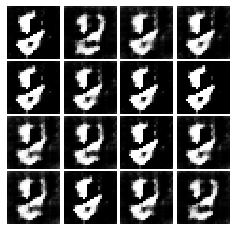

Epoch: 0, Iter: 460, D: 0.7161, G:3.677


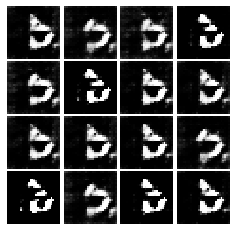

Epoch: 1, Iter: 480, D: 0.7186, G:2.47


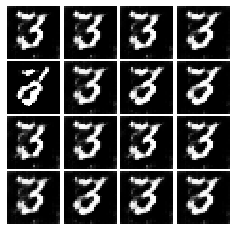

Epoch: 1, Iter: 500, D: 0.6626, G:1.823


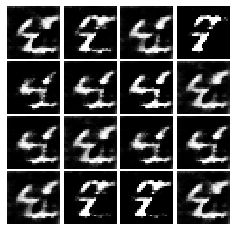

Epoch: 1, Iter: 520, D: 0.8579, G:1.689


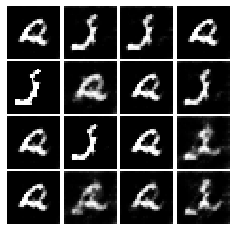

Epoch: 1, Iter: 540, D: 0.4722, G:1.959


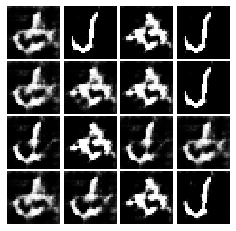

Epoch: 1, Iter: 560, D: 0.702, G:2.014


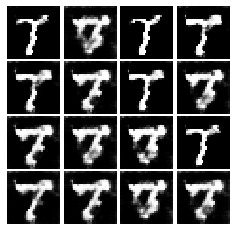

Epoch: 1, Iter: 580, D: 0.9742, G:1.899


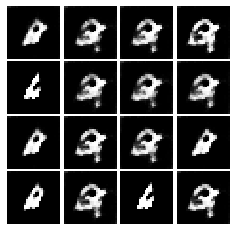

Epoch: 1, Iter: 600, D: 0.4697, G:2.21


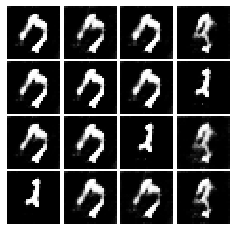

Epoch: 1, Iter: 620, D: 0.4581, G:2.785


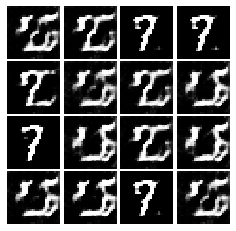

Epoch: 1, Iter: 640, D: 0.7301, G:1.818


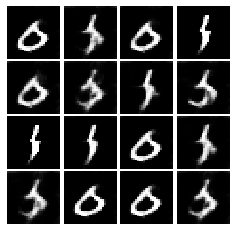

Epoch: 1, Iter: 660, D: 1.228, G:2.613


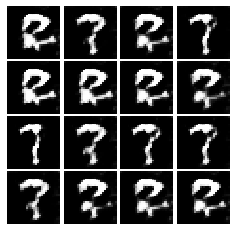

Epoch: 1, Iter: 680, D: 0.8435, G:1.711


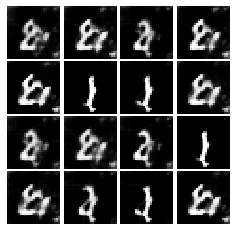

Epoch: 1, Iter: 700, D: 0.6677, G:2.372


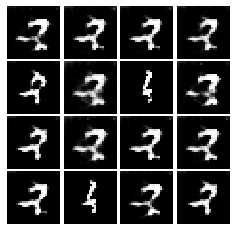

Epoch: 1, Iter: 720, D: 0.5613, G:2.757


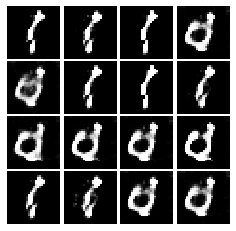

Epoch: 1, Iter: 740, D: 0.3289, G:2.551


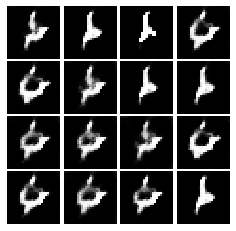

Epoch: 1, Iter: 760, D: 0.5853, G:3.217


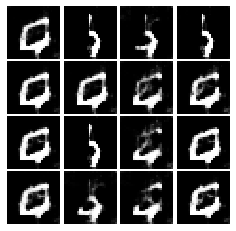

Epoch: 1, Iter: 780, D: 0.9956, G:1.979


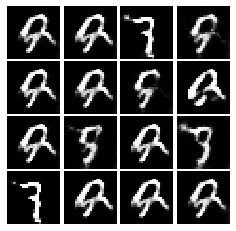

Epoch: 1, Iter: 800, D: 0.331, G:2.972


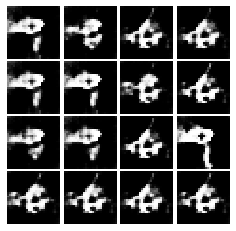

Epoch: 1, Iter: 820, D: 0.7949, G:2.18


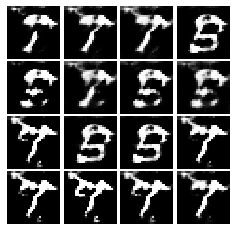

Epoch: 1, Iter: 840, D: 4.711, G:5.589


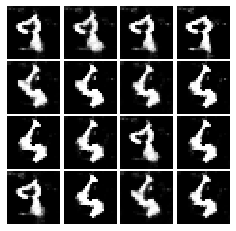

Epoch: 1, Iter: 860, D: 0.2708, G:2.475


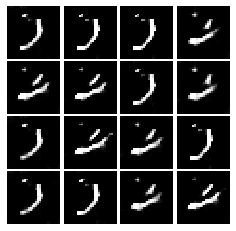

Epoch: 1, Iter: 880, D: 0.4066, G:5.216


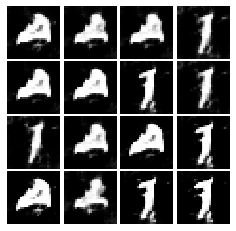

Epoch: 1, Iter: 900, D: 0.2912, G:3.363


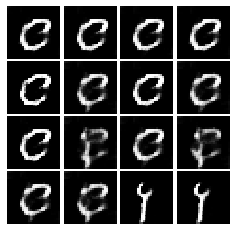

Epoch: 1, Iter: 920, D: 0.3532, G:3.798


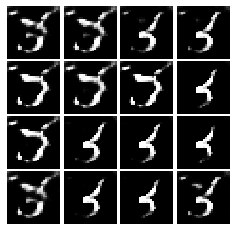

Epoch: 2, Iter: 940, D: 1.413, G:2.461


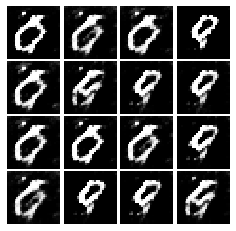

Epoch: 2, Iter: 960, D: 0.587, G:2.084


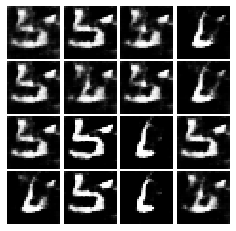

Epoch: 2, Iter: 980, D: 1.136, G:3.141


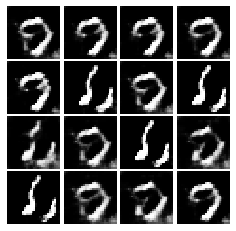

Epoch: 2, Iter: 1000, D: 0.9083, G:2.434


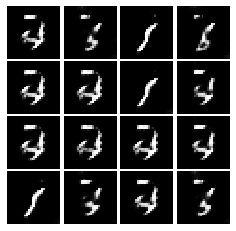

Epoch: 2, Iter: 1020, D: 0.2843, G:3.082


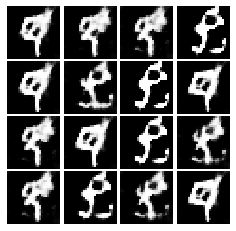

Epoch: 2, Iter: 1040, D: 0.969, G:2.019


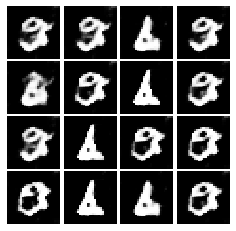

Epoch: 2, Iter: 1060, D: 0.5878, G:4.67


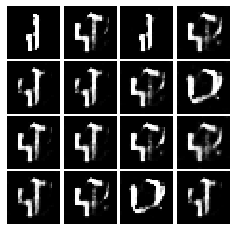

Epoch: 2, Iter: 1080, D: 0.5764, G:2.755


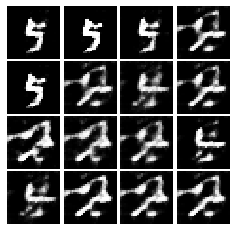

Epoch: 2, Iter: 1100, D: 0.2509, G:3.469


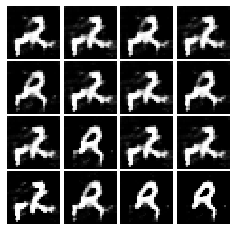

Epoch: 2, Iter: 1120, D: 0.7676, G:1.737


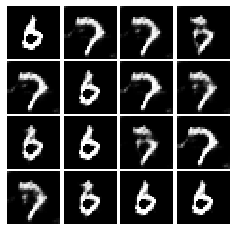

Epoch: 2, Iter: 1140, D: 0.5667, G:4.152


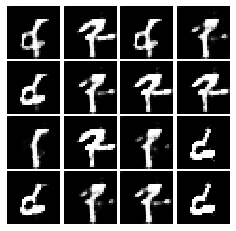

Epoch: 2, Iter: 1160, D: 0.9384, G:4.984


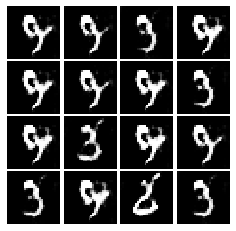

Epoch: 2, Iter: 1180, D: 0.2461, G:3.157


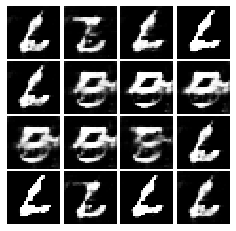

Epoch: 2, Iter: 1200, D: 0.8965, G:8.904


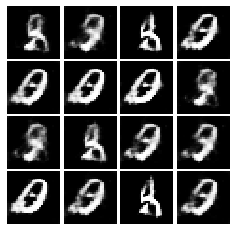

Epoch: 2, Iter: 1220, D: 0.6843, G:3.785


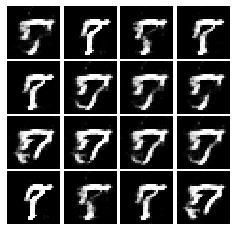

Epoch: 2, Iter: 1240, D: 0.9005, G:5.003


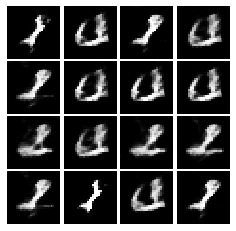

Epoch: 2, Iter: 1260, D: 0.8251, G:2.305


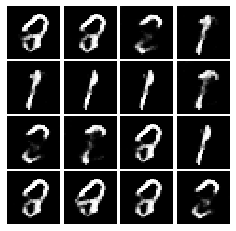

Epoch: 2, Iter: 1280, D: 0.4664, G:3.814


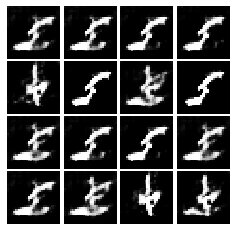

Epoch: 2, Iter: 1300, D: 0.4244, G:2.464


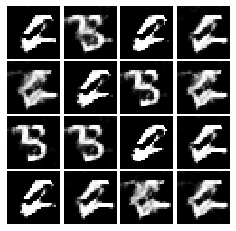

Epoch: 2, Iter: 1320, D: 0.2111, G:3.011


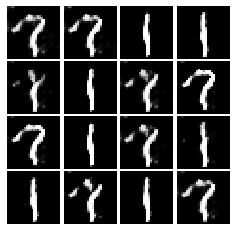

Epoch: 2, Iter: 1340, D: 0.1122, G:3.914


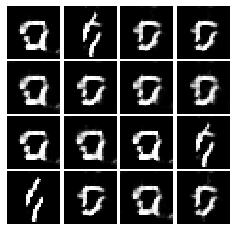

Epoch: 2, Iter: 1360, D: 0.2715, G:4.002


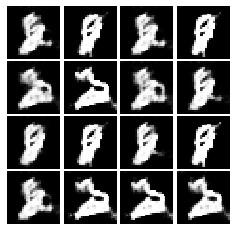

Epoch: 2, Iter: 1380, D: 1.194, G:2.439


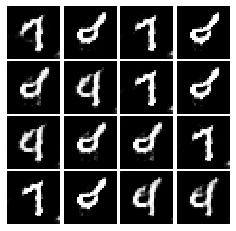

Epoch: 2, Iter: 1400, D: 0.4232, G:4.296


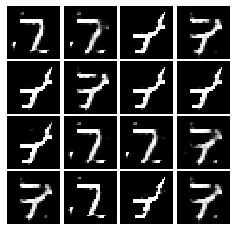

Epoch: 3, Iter: 1420, D: 0.0736, G:5.333


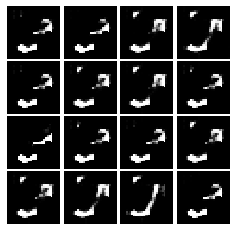

Epoch: 3, Iter: 1440, D: 0.2332, G:9.825


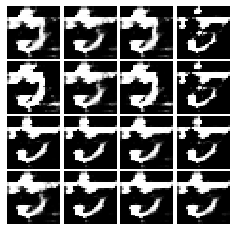

Epoch: 3, Iter: 1460, D: 0.6045, G:3.441


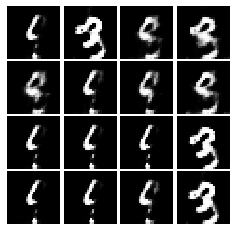

Epoch: 3, Iter: 1480, D: 0.4276, G:4.455


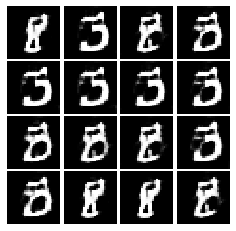

Epoch: 3, Iter: 1500, D: 0.3129, G:3.975


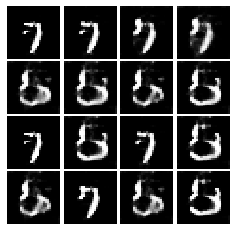

Epoch: 3, Iter: 1520, D: 0.1942, G:3.323


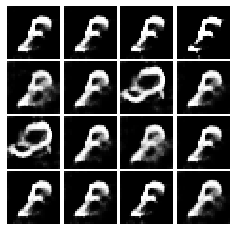

Epoch: 3, Iter: 1540, D: 0.7807, G:2.64


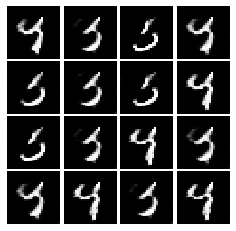

Epoch: 3, Iter: 1560, D: 0.425, G:4.806


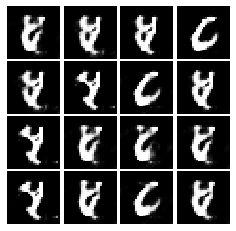

Epoch: 3, Iter: 1580, D: 0.5332, G:2.391


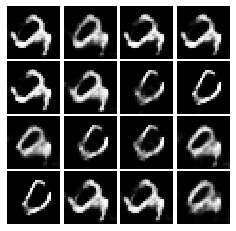

Epoch: 3, Iter: 1600, D: 0.6471, G:2.783


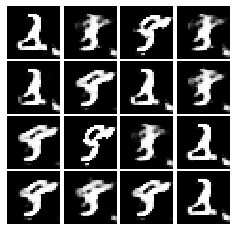

Epoch: 3, Iter: 1620, D: 0.5162, G:3.955


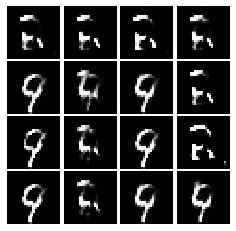

Epoch: 3, Iter: 1640, D: 0.7744, G:7.796


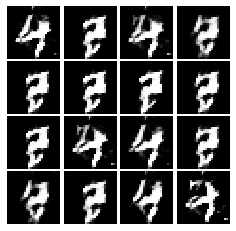

Epoch: 3, Iter: 1660, D: 0.2305, G:2.774


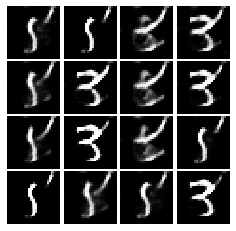

Epoch: 3, Iter: 1680, D: 2.038, G:2.957


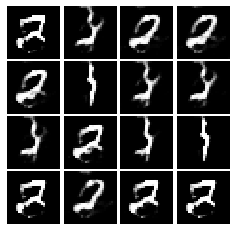

Epoch: 3, Iter: 1700, D: 0.5859, G:4.461


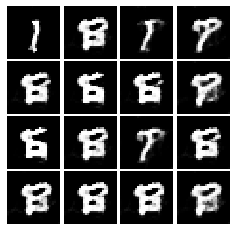

Epoch: 3, Iter: 1720, D: 0.6128, G:4.07


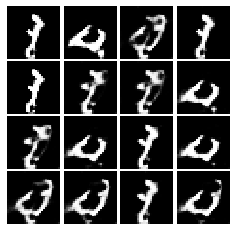

Epoch: 3, Iter: 1740, D: 0.4201, G:2.563


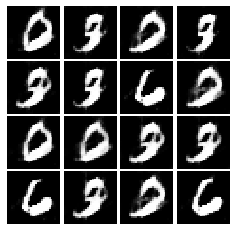

Epoch: 3, Iter: 1760, D: 0.167, G:3.381


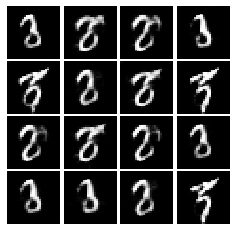

Epoch: 3, Iter: 1780, D: 0.449, G:3.366


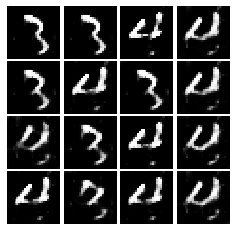

Epoch: 3, Iter: 1800, D: 0.6508, G:3.149


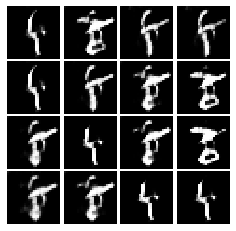

Epoch: 3, Iter: 1820, D: 0.7858, G:3.733


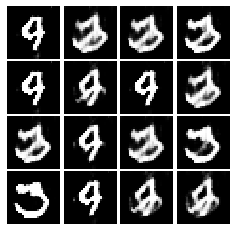

Epoch: 3, Iter: 1840, D: 0.3034, G:3.11


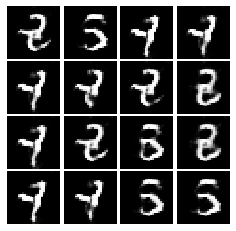

Epoch: 3, Iter: 1860, D: 0.5373, G:2.557


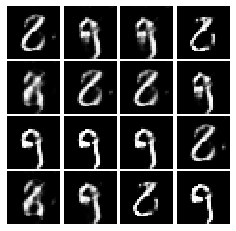

Epoch: 4, Iter: 1880, D: 0.4167, G:2.472


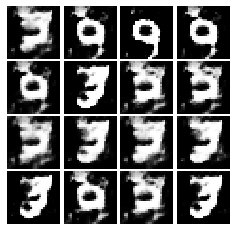

Epoch: 4, Iter: 1900, D: 0.2964, G:4.155


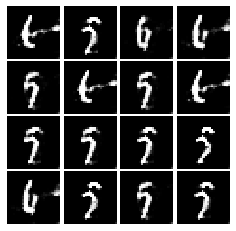

Epoch: 4, Iter: 1920, D: 0.3151, G:3.764


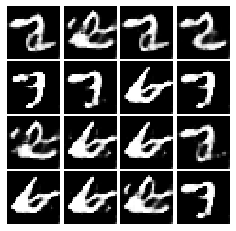

Epoch: 4, Iter: 1940, D: 0.5382, G:3.554


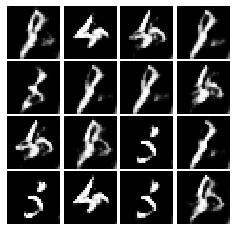

Epoch: 4, Iter: 1960, D: 0.7053, G:5.111


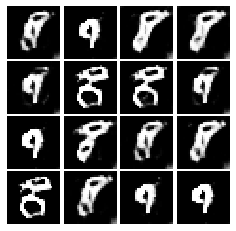

Epoch: 4, Iter: 1980, D: 0.4867, G:3.109


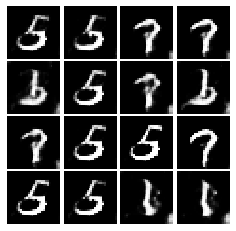

Epoch: 4, Iter: 2000, D: 0.7954, G:1.386


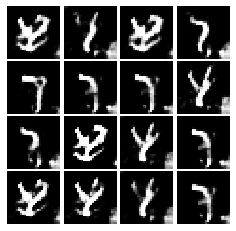

Epoch: 4, Iter: 2020, D: 0.4834, G:2.758


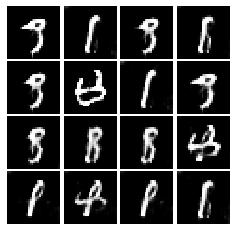

Epoch: 4, Iter: 2040, D: 0.2941, G:1.248


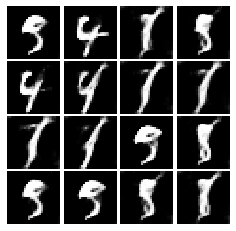

Epoch: 4, Iter: 2060, D: 0.1812, G:3.622


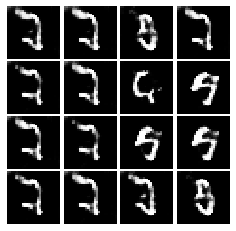

Epoch: 4, Iter: 2080, D: 0.4919, G:2.779


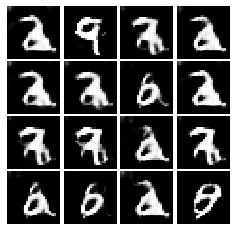

Epoch: 4, Iter: 2100, D: 0.5029, G:3.114


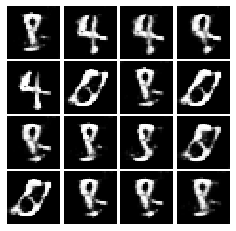

Epoch: 4, Iter: 2120, D: 0.331, G:3.059


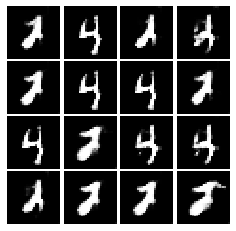

Epoch: 4, Iter: 2140, D: 0.1917, G:4.332


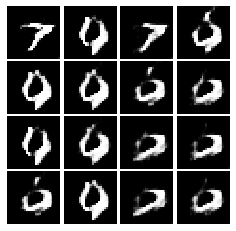

Epoch: 4, Iter: 2160, D: 0.4061, G:3.216


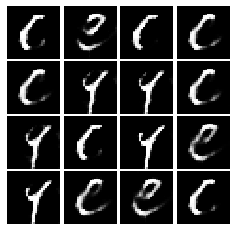

Epoch: 4, Iter: 2180, D: 0.1502, G:3.574


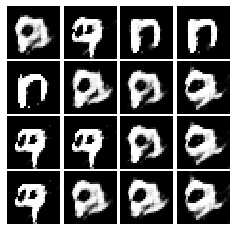

Epoch: 4, Iter: 2200, D: 0.5556, G:2.1


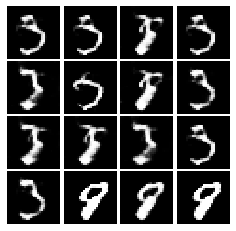

Epoch: 4, Iter: 2220, D: 0.2464, G:4.094


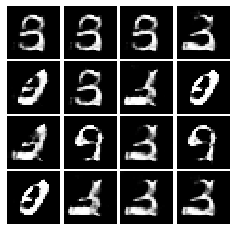

Epoch: 4, Iter: 2240, D: 0.9087, G:5.539


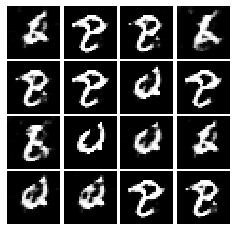

Epoch: 4, Iter: 2260, D: 0.5689, G:4.614


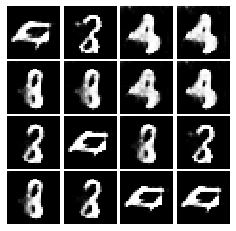

Epoch: 4, Iter: 2280, D: 0.1558, G:3.628


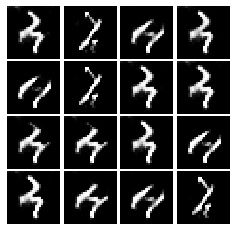

Epoch: 4, Iter: 2300, D: 0.1753, G:3.411


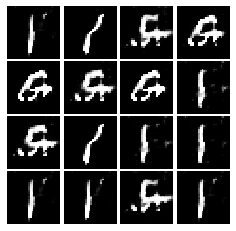

Epoch: 4, Iter: 2320, D: 0.2948, G:3.401


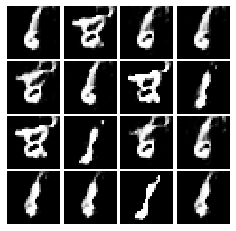

Epoch: 4, Iter: 2340, D: 0.2744, G:4.07


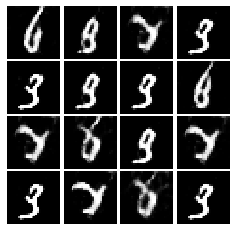

Final images


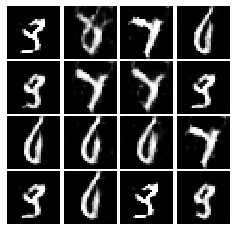

In [42]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |  -1   |  -2   |  -1   |   1     
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   |  -2   |  -1   |   1   |  2    |   1    
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 

No, we won't reach the optimal value. From the above example, we can see that (x, y) reach the initial values again at sixth step. It implies the process will loop infinitely.

## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 

No, it is not a good sign. High discriminator loss means that discriminator cannot tell whether images are real or not. So, even generator successfully confuses discriminator and obtains good generator loss, it cannot imply generator is good enough.